# Кластеризация

Задача относится к классу задач обучения без учителя **unsupervised learning** – когда у нас отсутствуют метки классов, мы должны по данным выявить некую закономерность, объединить объекты по схожим признакам, чтобы группы (кластеры) были различны друг от друга как можно больше.

Применение:

Разбиение текста по темам (тематическое моделирование), выявление паттернов поведения, либо групп (клиентов по типу поведения), поиск аномалий, построение иерархий объектов.


**Постановка задачи**

Дано:

- $X$ – пространство объектов
- $X^{l}=\left \{x_{1}, x_{2}, ...,x_{l}\right \}$ – обучающая выборка
- $\rho$ – функция расстояния между объектами
 
Найти:
- $Y$ – множество кластеров
- $a$ – алгоритм кластеризации

# EDA

**People**

- ID: Уникальный идентификатор клиента
- Year_Birth: Год рождения клиента
- Education: Уровень образования 
- Marital_Status: Семейное положение
- Income: Годовой доход
- Kidhome: Количество детей в семье клиента
- Teenhome: Количество подростков в семье клиента
- Dt_Customer: Дата регистрации клиента в компании
- Recency: Количество дней с момента последней покупки клиента
- Complain: 1, если клиент жаловался в течение последних 2 лет, 0 в противном случае

**Products**

- MntWines: Сумма, потраченная на вино за последние 2 года
- MntFruits: Сумма, потраченная на фрукты за последние 2 года
- MntMeatProducts: Сумма, потраченная на мясо за последние 2 года
- MntFishProducts: Сумма, потраченная на рыбу за последние 2 года
- MntSweetProducts: Сумма, потраченная на сладости за последние 2 года
- MntGoldProds: Сумма, потраченная на золото за последние 2 года

**Promotion**

- NumDealsPurchases: Количество покупок, совершенных со скидкой
- AcceptedCmp1: 1, если клиент принял предложение в 1-й кампании, 0 в противном случае
- AcceptedCmp2: 1, если клиент принял предложение во 2-й кампании, 0 в противном случае
- AcceptedCmp3: 1, если клиент принял предложение во 3-й кампании, 0 в противном случае
- AcceptedCmp4: 1, если клиент принял предложение во 4-й кампании, 0 в противном случае
- AcceptedCmp5: 1, если клиент принял предложение во 5-й кампании, 0 в противном случае
- Response: 1, если клиент принял предложение в последней кампании, 0 в противном случае

**Place**

- NumWebPurchases: Количество покупок, совершенных через веб-сайт компании
- NumCatalogPurchases: Количество покупок, сделанных с использованием каталога
- NumStorePurchases: Количество покупок, совершенных непосредственно в магазинах
- NumWebVisitsMonth: Количество посещений веб-сайта компании за последний месяц

**Задача**

- Обнаружение сегментов клиентов

In [1]:
import pandas as pd
import numpy as np

from typing import Tuple

import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering, KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score

from umap import UMAP

import plotly.express as px

from utils import plotting_object, plotting_kde_num, plot_clustering, plotting_num, \
plot_size, silhouette_plot

import warnings
warnings.filterwarnings("ignore")

RAND = 10

In [2]:
df = pd.read_csv('marketing_campaign.csv', sep='\t')

In [3]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [5]:
df.dropna(inplace=True)

In [6]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.0,2216.0,2216.000000
mean,5588.353339,1968.820397,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,...,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,3.0,11.0,0.150271
std,3249.376275,11.985554,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,...,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.0,0.0,0.357417
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2814.750000,1959.000000,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8421.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


Удалим колонки Z_CostContact, Z_Revenue, так как во всех объектах одинаковые значения в признаках, а также ID

In [7]:
df.drop(['ID','Z_CostContact', 'Z_Revenue'], axis=1, inplace=True)

In [8]:
df.describe(include='object')

,Education,Marital_Status,Dt_Customer
count,2216,2216,2216
unique,5,8,662
top,Graduation,Married,31-08-2012
freq,1116,857,12


In [9]:
max(pd.to_datetime(
            df['Dt_Customer'], format='%d-%m-%Y'))

Timestamp('2014-06-29 00:00:00')

## Feature engineering

In [10]:
df[:2]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,1,2,5,0,0,0,0,0,0,0


Чтобы нам не получить большое кол-во выбросов в данных, возьмем +2 года от максимальной даты регистрации

In [11]:
end_data = max(pd.to_datetime(
    df['Dt_Customer'], format='%d-%m-%Y')) + pd.offsets.DateOffset(years=2)

In [12]:
def get_diffrent_date(end_data: pd.Timestamp,
                      data: Tuple[str, int],
                      type_date: str = 'year') -> int:
    if type_date == 'year':
        time_data = int(end_data.year -
                        pd.to_datetime(data, format='%Y').year)
    elif type_date == 'month':
        time_data = end_data.to_period('M') - pd.to_datetime(
            data, format='%d-%m-%Y').to_period('M')
        time_data = time_data.n
    else:
        time_data = end_data - pd.to_datetime(data)
        time_data = int(time_data.days)
    return time_data

Получение возраста и месяцев с момента регистрации на текущий день

In [13]:
df['Age'] = df.Year_Birth.apply(lambda x: get_diffrent_date(end_data, x))
df['Month_register'] = df.Dt_Customer.apply(
    lambda x: get_diffrent_date(end_data, x, type_date='month'))

In [14]:
df[:5]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Month_register
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,7,0,0,0,0,0,0,1,59,45
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,5,0,0,0,0,0,0,0,62,27
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,...,4,0,0,0,0,0,0,0,51,34
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,...,6,0,0,0,0,0,0,0,32,28
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,...,5,0,0,0,0,0,0,0,35,29


Общая сумма потраченная на продукты

In [15]:
cols_mnt = [col for col in df.columns if col.find('Mnt')> -1]
df['Sum_Purchases'] = df[cols_mnt].sum(axis=1)

In [16]:
cols_mnt

['MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds']

Кол-во кампаний, в которой клиент принял предложение

In [17]:
cols_acc = [col for col in df.columns if col.find('Accepted')> -1] + ['Response']
df['Count_Campaigns'] = df[cols_acc].sum(axis=1)

Общее кол-во покупок

In [18]:
cols_num = [col for col in df.columns if col.find('Num')> -1][1:-1]
df['Count_Purchases'] = df[cols_num].sum(axis=1)

In [19]:
df[:3]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Month_register,Sum_Purchases,Count_Campaigns,Count_Purchases
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,0,0,0,0,1,59,45,1617,1,22
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,0,0,0,0,0,62,27,27,0,4
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,...,0,0,0,0,0,51,34,776,0,20


Кол-во детей в семье, family size

In [20]:
df.Marital_Status.value_counts()

Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

In [21]:
dict_replace_marital = {
    'Married': 'Relationship',
    'Together': 'Relationship',
    'Single': 'Single',
    'Divorced': 'Single',
    'Widow': 'Single',
    'Alone': 'Single',
    'Absurd': 'Single',
    'YOLO': 'Single'
}

In [22]:
df['Marital_Status'] = df['Marital_Status'].replace(dict_replace_marital)

In [23]:
df['Children'] = df['Kidhome'] + df['Teenhome']

df["Family_Size"] = df["Marital_Status"].replace({
    "Single": 1,
    "Relationship": 2
}) + df["Children"]

In [24]:
df["Is_Parent"] = np.where(df.Children> 0, 1, 0)

In [25]:
def marital_status_children(data):
    if data["Is_Parent"] == 1:
        return "Family with Children"
    elif data["Marital_Status"] == "Relationship" and data["Is_Parent"] == 0:
        return "Relationship"
    else:
        return "Single"

In [26]:
df["Marital_Status_Children"] = df.apply(lambda x: marital_status_children(x), axis=1)  

In [27]:
df = df.drop('Is_Parent', axis=1)

In [28]:
df[:3]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Complain,Response,Age,Month_register,Sum_Purchases,Count_Campaigns,Count_Purchases,Children,Family_Size,Marital_Status_Children
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,0,1,59,45,1617,1,22,0,1,Single
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,0,0,62,27,27,0,4,2,3,Family with Children
2,1965,Graduation,Relationship,71613.0,0,0,21-08-2013,26,426,49,...,0,0,51,34,776,0,20,0,2,Relationship


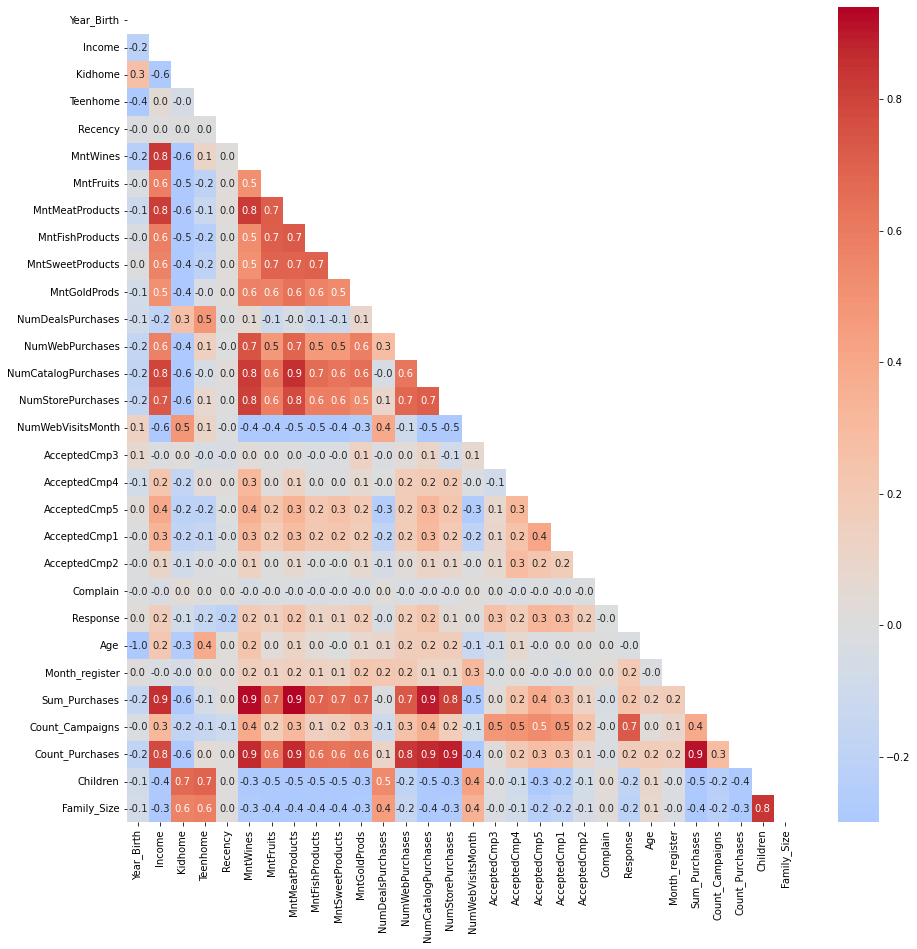

In [29]:
matrix = np.triu(df.corr(method='spearman'))

plt.figure(figsize=(15, 15))

sns.heatmap(df.corr(method='spearman'), annot=True,
            fmt='.1f', vmin=-0.3, center=0, cmap='coolwarm', mask=matrix);

In [30]:
cols_plot = [
    'Income', 'Recency', 'Sum_Purchases', 'Count_Purchases', 'Count_Campaigns',
    'Age', 'Marital_Status_Children'
]

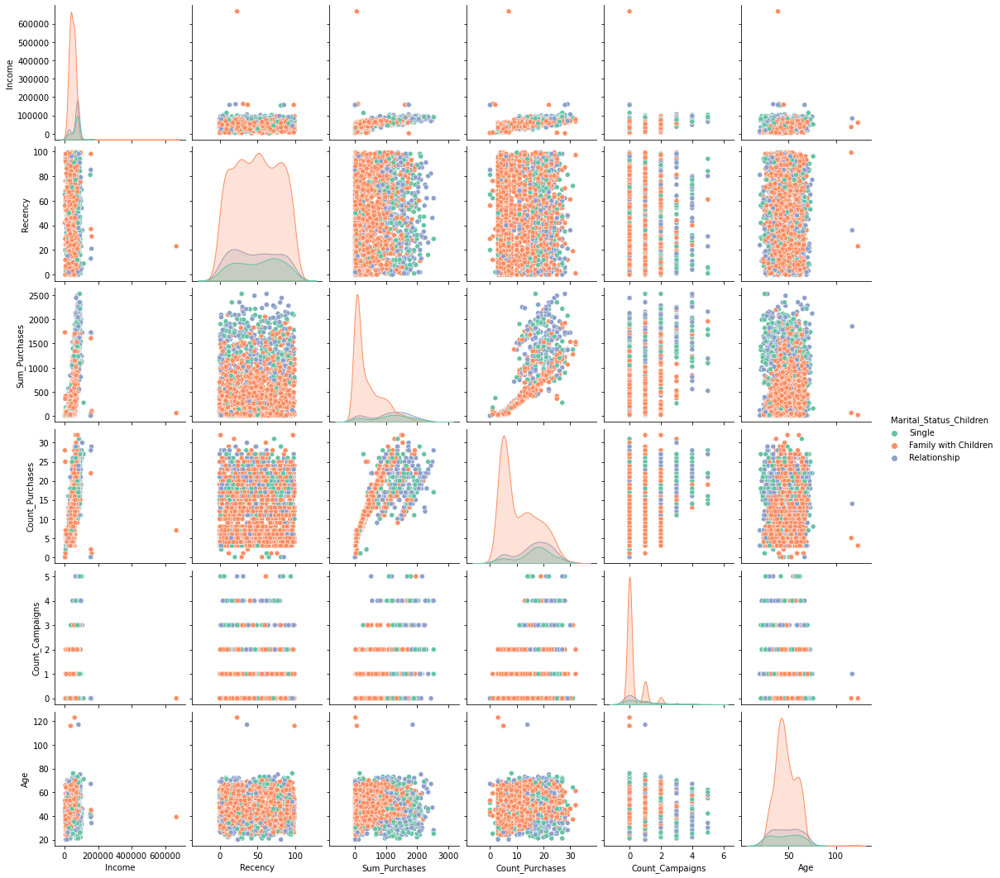

In [31]:
sns.pairplot(df[cols_plot], hue='Marital_Status_Children', palette='Set2')
plt.show()

In [32]:
df[cols_plot[:-1]].describe()

,Income,Recency,Sum_Purchases,Count_Purchases,Count_Campaigns,Age
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,52247.251354,49.012635,607.075361,12.557310,0.448556,47.179603
std,25173.076661,28.948352,602.900476,7.204611,0.892440,11.985554
min,1730.000000,0.000000,5.000000,0.000000,0.000000,20.000000
25%,35303.000000,24.000000,69.000000,6.000000,0.000000,39.000000
50%,51381.500000,49.000000,396.500000,12.000000,0.000000,46.000000
75%,68522.000000,74.000000,1048.000000,18.000000,1.000000,57.000000
max,666666.000000,99.000000,2525.000000,32.000000,5.000000,123.000000


Удалим объекты, где есть выбросы в Age и Income

In [33]:
def remove_outliers(data: pd.DataFrame, column: str) -> pd.Series:
    Q3, Q1 = np.nanpercentile(data[column], [75, 25])
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR
    data = data[(data[column] > lower_bound) & (data[column] < upper_bound)]

    return data

In [34]:
df = remove_outliers(data=df, column='Age')
df = remove_outliers(data=df, column='Income')

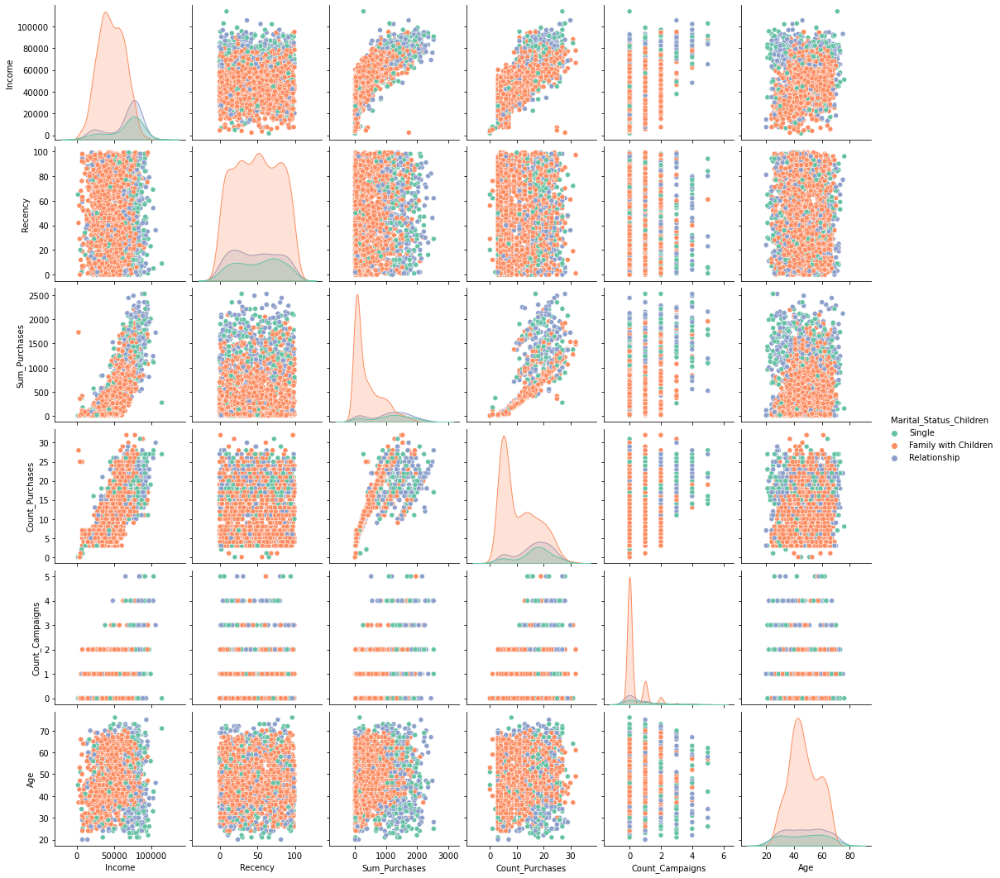

In [35]:
sns.pairplot(df[cols_plot], hue='Marital_Status_Children', palette='Set2')
plt.show()

# Modeling

In [36]:
df_save = df.copy()
df = df.drop(['Year_Birth', 'Dt_Customer'] + cols_acc, axis=1)

In [37]:
df_labels = pd.get_dummies(df)
df_labels[:4]

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Relationship,Marital_Status_Single,Marital_Status_Children_Family with Children,Marital_Status_Children_Relationship,Marital_Status_Children_Single
0,58138.0,0,0,58,635,88,546,172,88,88,...,0,0,1,0,0,0,1,0,0,1
1,46344.0,1,1,38,11,1,6,2,1,6,...,0,0,1,0,0,0,1,1,0,0
2,71613.0,0,0,26,426,49,127,111,21,42,...,0,0,1,0,0,1,0,0,1,0
3,26646.0,1,0,26,11,4,20,10,3,5,...,0,0,1,0,0,1,0,1,0,0


## Visualization

### PCA

**PCA (Principal Component Analysis)** - метод главных компонент, находит только линейные комбинации исходных признаков. Метод заключается в приближении матрицы признаков матрицей меньшего ранга, так называемое низкоранговое приближение. PCA находит множество новых измерений, которые ортогональны (таким образом линейно независимы) и отранжированы по величине дисперсии, которую они объясняют. Это значит, что более значимые principal оси будут первыми (более значимые = больше дисперсия/больше разброс в данных).


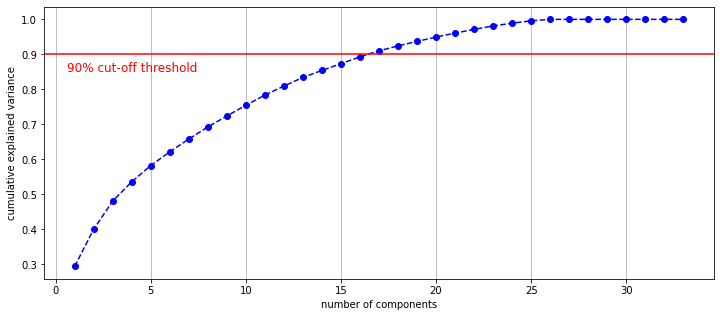

In [38]:
X_scaled = StandardScaler().fit_transform(df_labels)

pca = PCA().fit(X_scaled)

plt.figure(figsize=(12, 5))
x = np.arange(1, len(pca.explained_variance_ratio_)+1, 1)
plt.plot(x, np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--', color='b')
plt.axhline(y=0.9, color='r', linestyle='-')
plt.text(0.6, 0.85, '90% cut-off threshold', color = 'red', fontsize=12)
plt.grid(axis='x')

plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [39]:
pca = PCA(n_components=6).fit(X_scaled)

components = pca.fit_transform(X_scaled)
total_var = pca.explained_variance_ratio_.sum() * 100
n_components = len(pca.explained_variance_ratio_)

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Median Price'
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(marker_size=1, diagonal_visible=False)

fig.update_layout(
    font=dict(size=10, color='black'),
    autosize=False,
    width=1000,
    height=800,
)
fig.show()

In [40]:
X_scaled = StandardScaler().fit_transform(df_labels)

pca = PCA(n_components=0.9, random_state=RAND)
X_embedding_pca = pca.fit_transform(X_scaled)

pca_3 = PCA(n_components=3, random_state=RAND)
X_embedding_pca_3 = pca_3.fit_transform(X_scaled)

fig = px.scatter_3d(
    X_embedding_pca, x=0, y=1, z=2,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)
fig.show()

### T-SNE

**T-SNE (t-распределенное стохастическое вложение соседей)** - вероятностный метод. T-SNE сводит к минимуму расхождение между двумя распределениями: распределением, которое измеряет попарное сходство входных объектов, и распределением, которое измеряет попарное сходство соответствующих точек с низкой размерностью во вложении.

Ограничения для использования этого метода. 
- Для очень больших размерных данных, возможно, потребуется применить другой метод уменьшения размерности перед использованием t-SNE - PCA для плотных данных
- TruncatedSVD для разреженных данных

In [41]:
%time
tsne = TSNE(n_components=3, random_state=RAND)
X_embedding_tsne = tsne.fit_transform(df_labels)

fig = px.scatter_3d(
    X_embedding_tsne, x=0, y=1, z=2,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)
fig.show()

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 6.91 µs


### UMAP

**UMAP (Uniform Manifold Approximation and Projection)** - как и T-SNE нелинейный метод. При снижении размерности UMAP сначала выполняет построение взвешенного графа, соединяя ребрами только те объекты, которые являются ближайшими соседями. Множество из ребер графа — это нечёткое множество с функцией принадлежности, она определяется как вероятность существования ребра между двумя вершинами. Затем алгоритм создает граф в низкоразмерном пространстве и приближает его к исходному, минимизируя сумму дивергенций Кульбака-Лейблера для каждого ребра из множеств. https://www.wikiwand.com/ru/UMAP

In [42]:
%time
umap = UMAP(n_components=3, random_state=RAND)
X_embedding_umap = umap.fit_transform(X_scaled)

fig = px.scatter_3d(
    X_embedding_umap, x=0, y=1, z=2,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)
fig.show()

CPU times: user 4 µs, sys: 2 µs, total: 6 µs
Wall time: 12.2 µs


## Clustering

Сравнение различных методов кластеризации

<img src='https://scikit-learn.org/stable/_images/sphx_glr_plot_cluster_comparison_001.png' width="700">

In [43]:
object_cols = [
    'Education', 'Marital_Status_Children', 'Children', 'Family_Size',
    'Teenhome', 'Kidhome'
]

num_cols = [
    'Age',
    'Income',
    'Month_register',
    'Sum_Purchases',
    'Count_Campaigns',
    'Recency',
    'NumDealsPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebPurchases',
    'NumWebVisitsMonth',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
]

### KMeans

Основан на подборе числа кластеров относительно расстояния до центров кластеров, которые были выбраны изначально случайным образом. По умолчанию используется k-means++, который в начале инициализирует первый центроид как random, далее следующий центроид ищет более оптимальным путем при помощи вычисления квадрата расстояния до ближайшего центроида для каждой точки.

https://towardsdatascience.com/understanding-k-means-k-means-and-k-medoids-clustering-algorithms-ad9c9fbf47ca

In [44]:
params_cluster = {
    'KMeans': {
        'random_state': RAND,
    },
    'SpectralClustering': {
        'random_state': RAND,
        'affinity': 'nearest_neighbors',
        'n_neighbors': 25,
        'n_jobs': -1
    },
    'AgglomerativeClustering': {
    }
}

- **Силуэтный коэффициент (silhouette score)** - Чем выше значение данной метрики, тем больше вероятность, что объекты довольно хорошо сгруппированы в кластеры. Оценивает расстояние как между объектами внутри кластера, так и между объектами соседних кластеров.
- **Индекс Calinski–Harabasz** - Оценка высокая, когда кластеры плотные и хорошо разделимы. Индекс Calinski–Harabasz, как правило, больше подходит для выпуклых кластеров. Индекс представляет собой отношение суммы дисперсии между кластерами и дисперсии внутри кластера для всех кластеров (sklearn)

https://scikit-learn.org/stable/modules/clustering.html#silhouette-coefficient

https://scikit-learn.org/stable/modules/clustering.html#calinski-harabasz-index 

  0%|          | 0/10 [00:00<?, ?it/s]

2 clusters
----------------------------------------------------------------------------------------------------


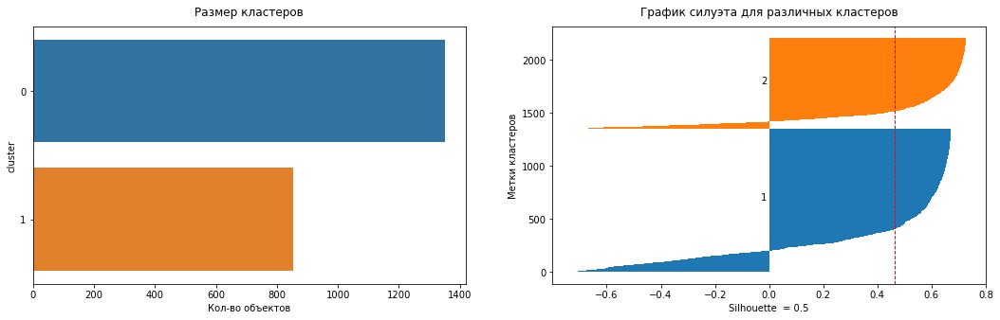

3 clusters
----------------------------------------------------------------------------------------------------


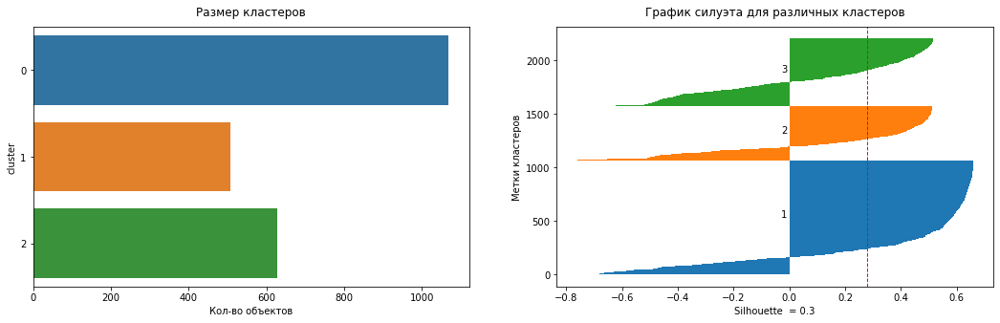

4 clusters
----------------------------------------------------------------------------------------------------


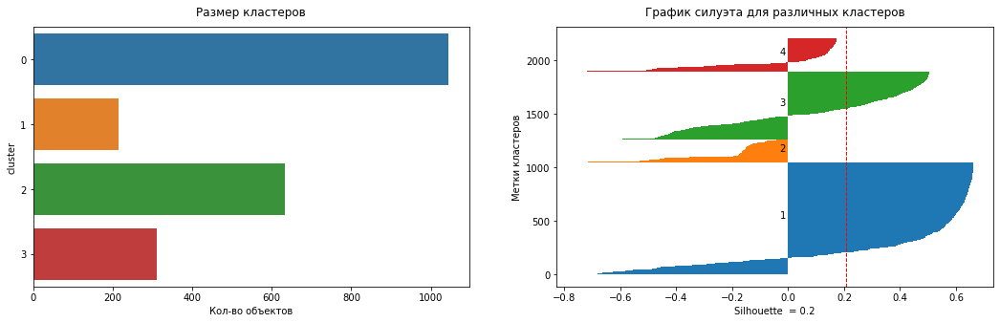

5 clusters
----------------------------------------------------------------------------------------------------


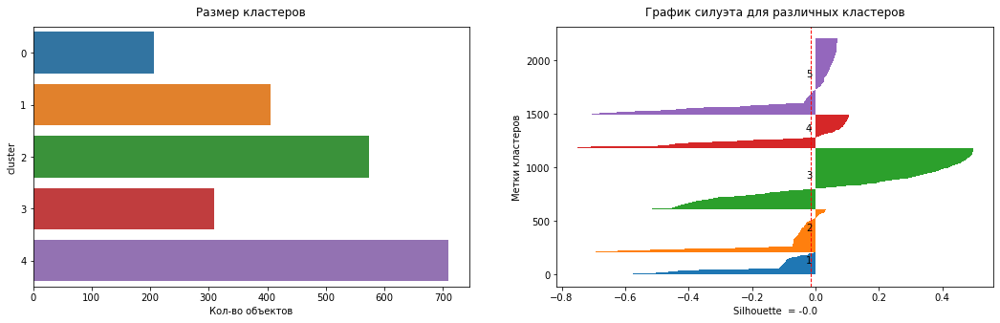

6 clusters
----------------------------------------------------------------------------------------------------


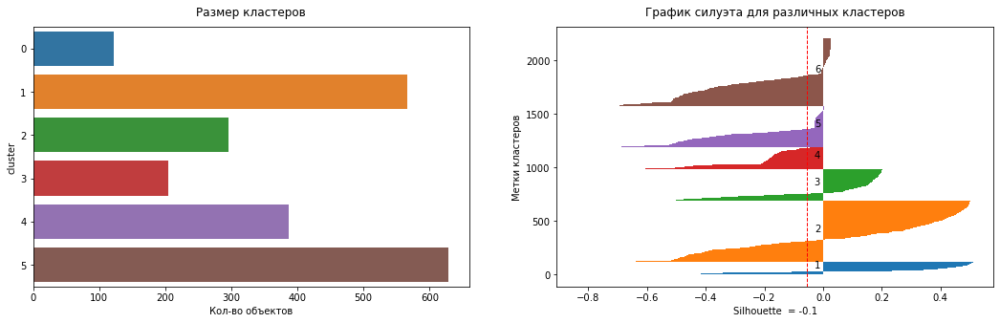

7 clusters
----------------------------------------------------------------------------------------------------


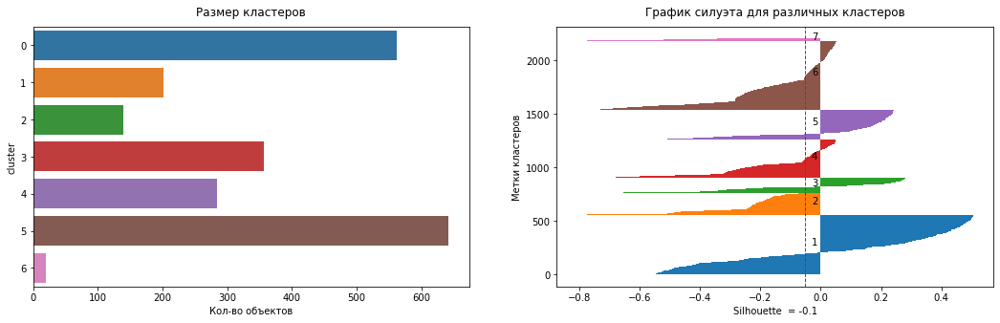

8 clusters
----------------------------------------------------------------------------------------------------


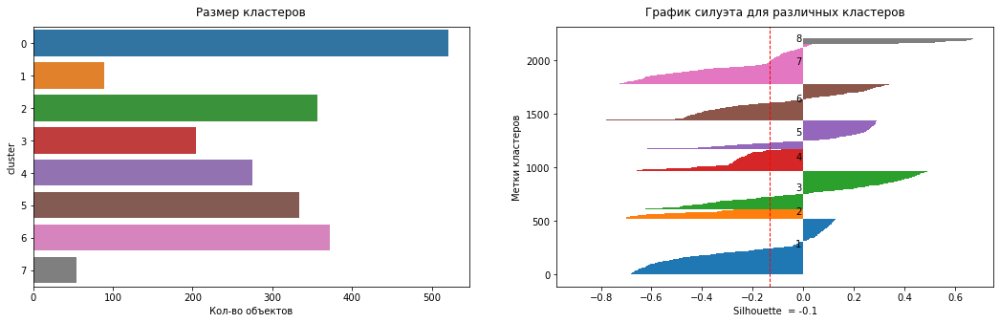

9 clusters
----------------------------------------------------------------------------------------------------


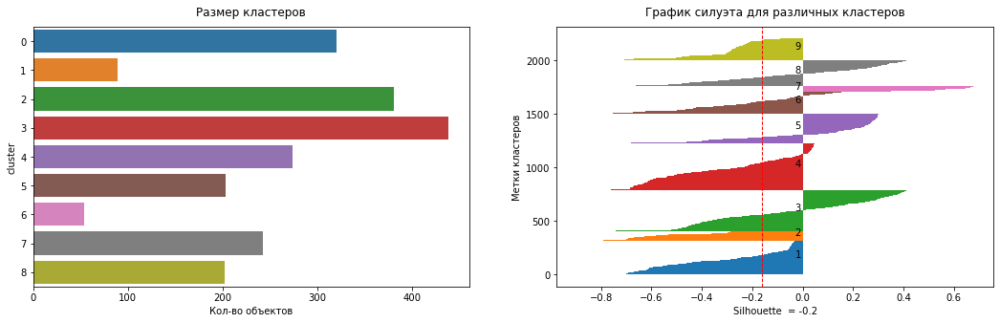

10 clusters
----------------------------------------------------------------------------------------------------


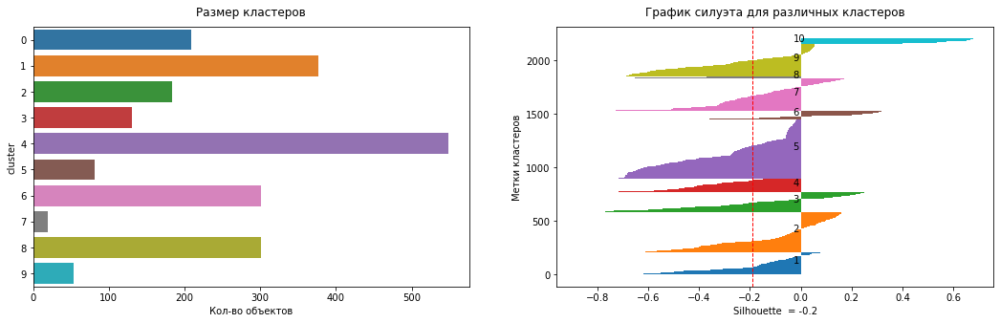

11 clusters
----------------------------------------------------------------------------------------------------


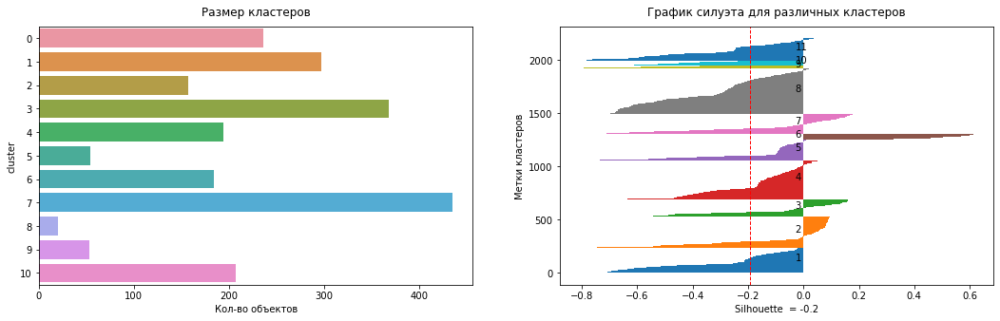

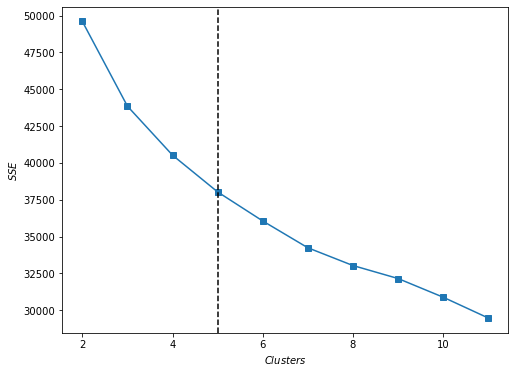

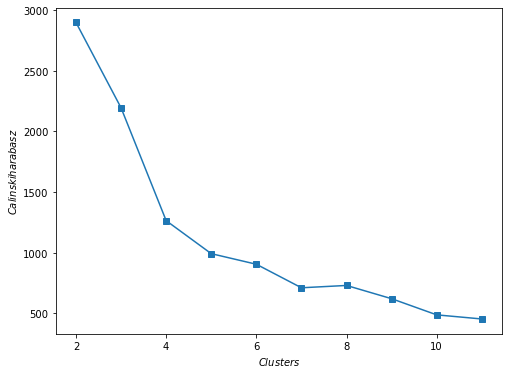

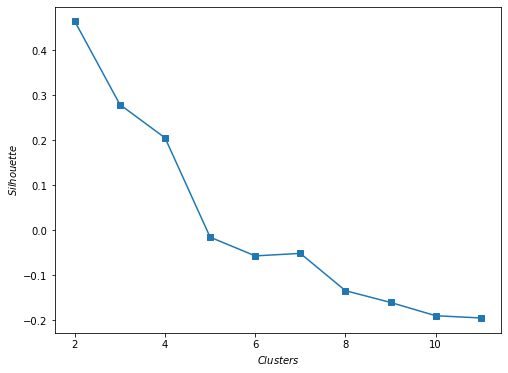

In [45]:
dict_clusters_km = plot_clustering(data=df_labels,
                                   data_scale=X_scaled,
                                   embedding=X_embedding_pca,
                                   kwargs=params_cluster['KMeans'],
                                   model=KMeans,
                                   type_train='embedding')

#### 3 clusters

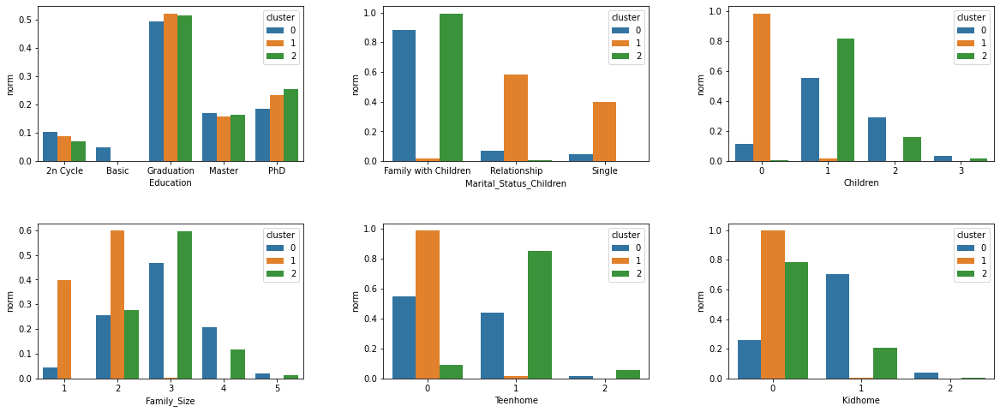

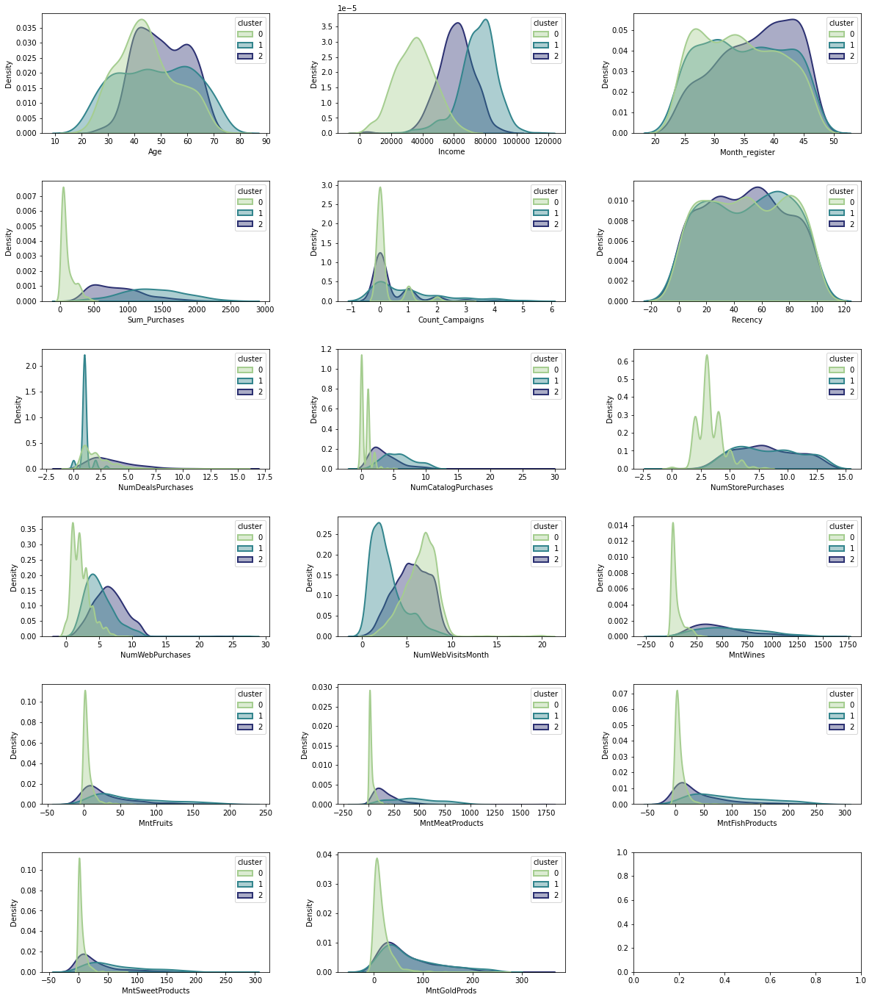

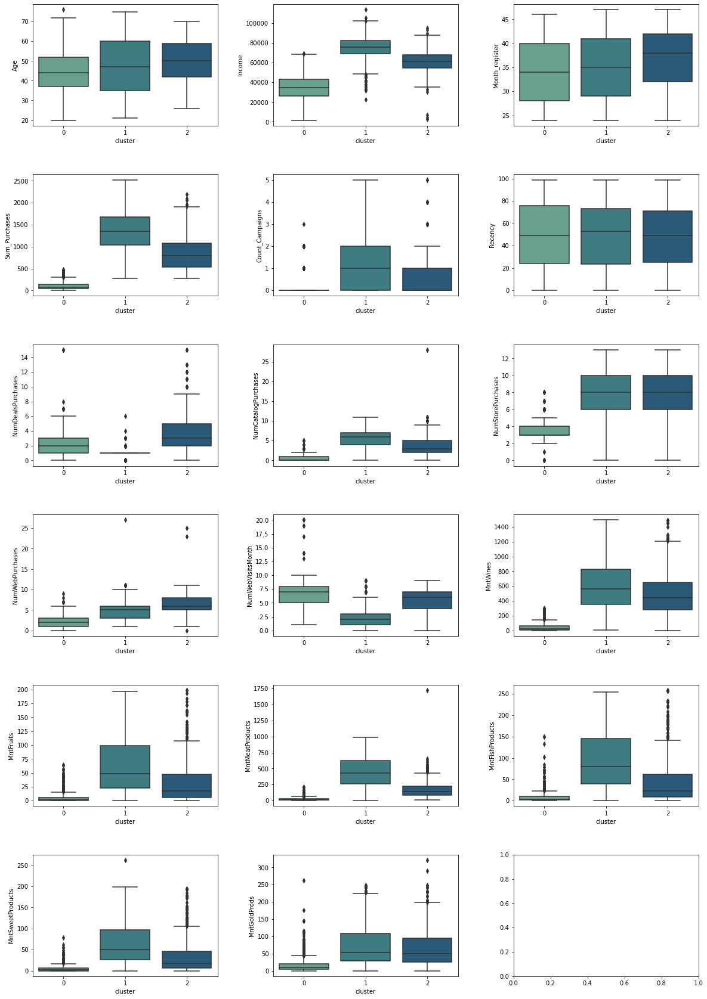

In [46]:
plotting_object(df, dict_clusters_km[3], object_cols)
plotting_kde_num(df, dict_clusters_km[3], num_cols)
plotting_num(df, dict_clusters_km[3], num_cols)

**Описание**

- **0 кластер** - семьи с детьми (немного тех, кто без детей), высшее образование (магистр, PhD) + неоконченное высшее, 0-3 ребенка в семье (преимущественно доподросткового возраста), средний доход 37000, средний возраст 45 лет, ср кол-во покупок 150 (мало), относительно недавно зарегестрированы ~ 34 мес, среднее кол-во покупок по скидке, мало покупок по веб/каталогу/в магазине, зато чаще остальных заходили на сайт, мало покупок по разным типам продуктов

- **1 кластер** - люди без пары, либо в паре без детей, высшее образование (магистр, PhD) + неоконченное высшее, средний доход 79000, средний возраст 47 лет, ср кол-во покупок 1250 (высоко), дальше зарегестрированы ~36 мес, мало покупок по скидке, среднее по веб, больше покупок с использованием каталога, в магазине, больше покупок вина, фруктов, мяса, рыбы, сладкого и чуть больше остальных золота

- **2 кластер** - семьи с детьми, высшее образование (магистр, PhD), 1-2 ребенка в семье (преимущественно подростки), средний доход 60000, средний возраст 50 лет, ср кол-во покупок 750 (средне), зарегестрированы ~ 38 мес, больше всего покупок по скидке, в магазине, веб, среднее по каталогу, среднее кол-во покупок по разным типам продуктов

In [47]:
fig = px.scatter_3d(
    X_embedding_pca, x=0, y=1, z=2,
    labels={'color': 'species'},
    color=dict_clusters_km[3]
)
fig.update_traces(marker_size=2)
fig.show()

<AxesSubplot:>

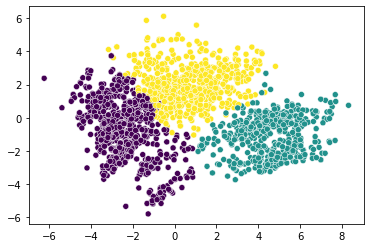

In [48]:
sns.scatterplot(X_embedding_pca[:,0], X_embedding_pca[:,1], c=dict_clusters_km[3])

<AxesSubplot:xlabel='Income', ylabel='Sum_Purchases'>

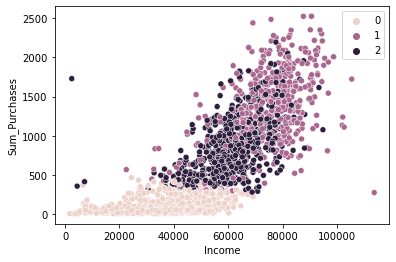

In [49]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=dict_clusters_km[3])

#### 4 clusters

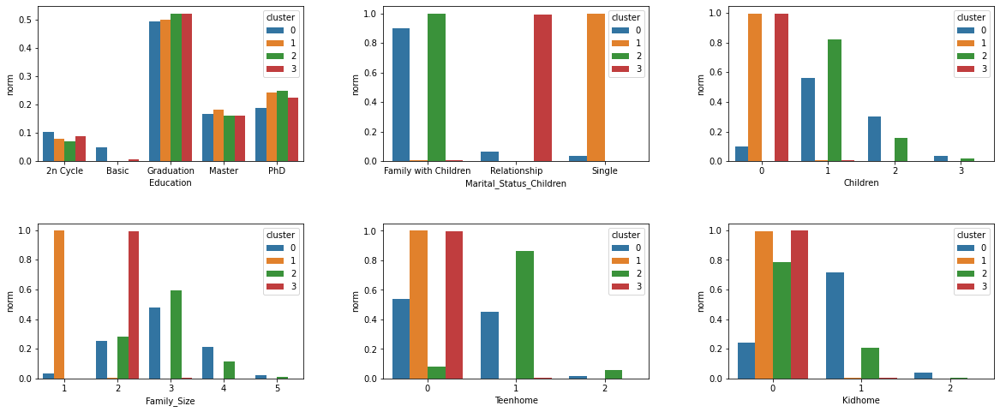

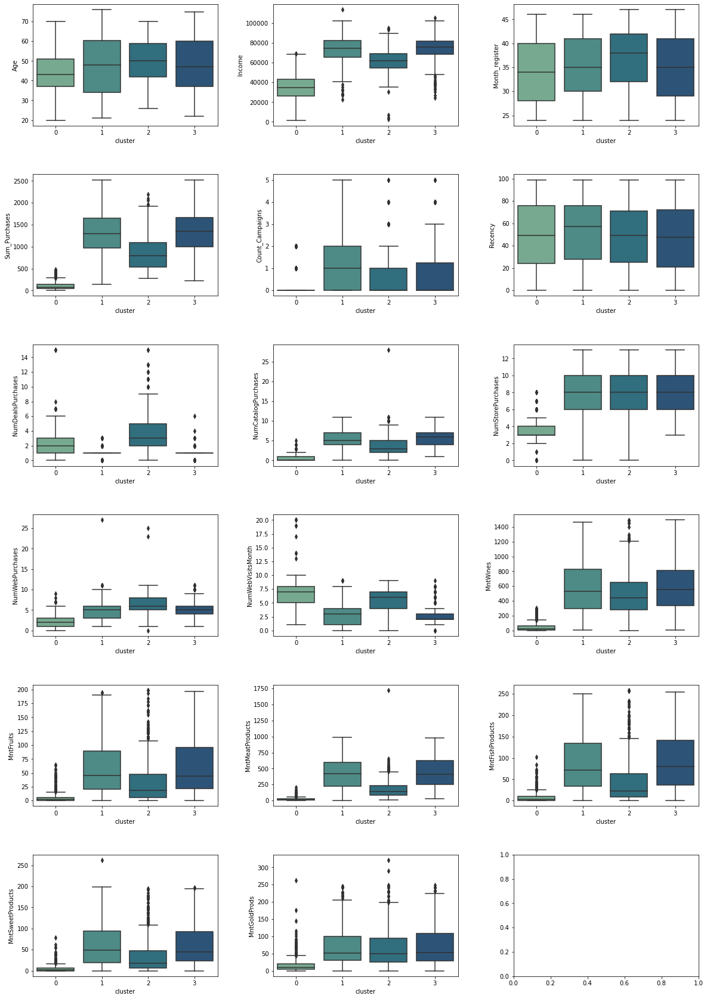

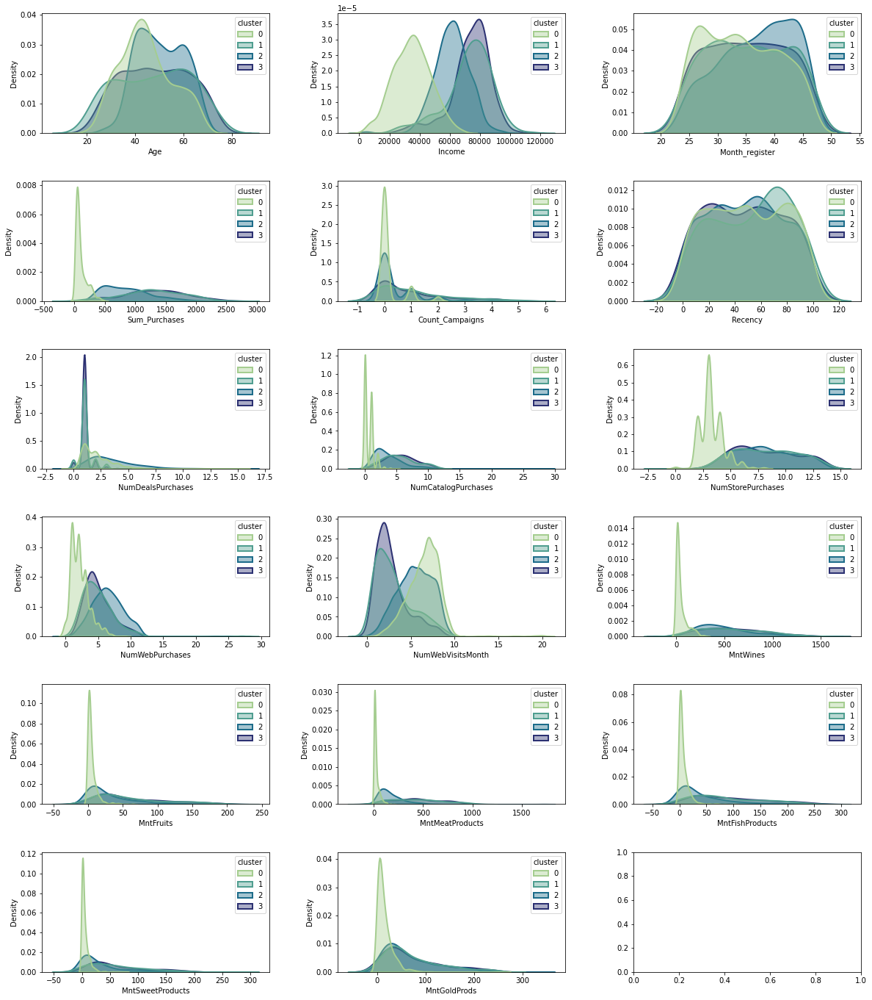

In [50]:
plotting_object(df, dict_clusters_km[4], object_cols)
plotting_num(df, dict_clusters_km[4], num_cols)
plotting_kde_num(df, dict_clusters_km[4], num_cols)

In [51]:
fig = px.scatter_3d(
    X_embedding_pca, x=0, y=1, z=2,
    labels={'color': 'species'},
    color=dict_clusters_km[4]
)
fig.update_traces(marker_size=2)
fig.show()

<AxesSubplot:xlabel='Income', ylabel='Sum_Purchases'>

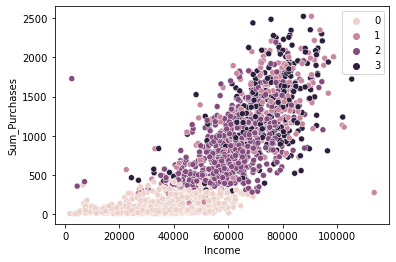

In [52]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=dict_clusters_km[4])

### Spectral Clustering


Основан на построении графа близости. Его вершинами являются объекты, а вес соединяющихих ребер соответствует схожести (или близости) этих объектов. Кластерами же объявляются группы объектов, попадающих в одну компоненту связности (для поиска минимизируем нормированную сумму весов ребер RatioCut, соединяющих данные группы). Используется для невыпуклых структур данных.

На выбор можно получить кластеры при помощи графа ближайших соседей, полносвязного графа (можно использовать различные ядра rbf, poly ..), вычисление Лапласиана и дальнейшее получение кластеров при помощи KMeans, также можно предварительно вычислись матрицу affinity

https://people.csail.mit.edu/dsontag/courses/ml14/notes/Luxburg07_tutorial_spectral_clustering.pdf

https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.165.9323&rep=rep1&type=pdf

  0%|          | 0/10 [00:00<?, ?it/s]

2 clusters
----------------------------------------------------------------------------------------------------


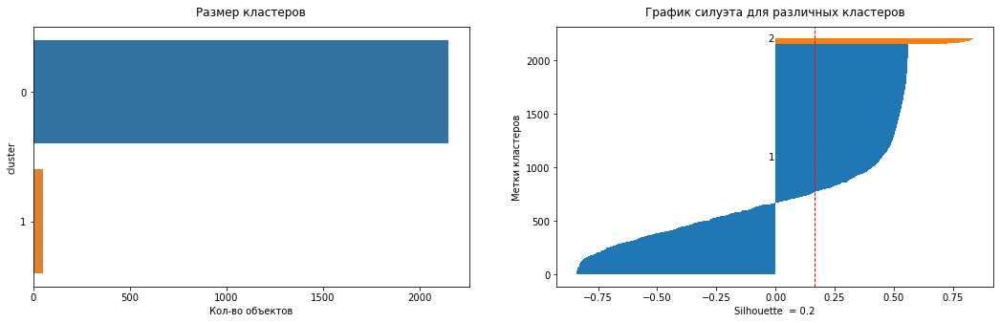

3 clusters
----------------------------------------------------------------------------------------------------


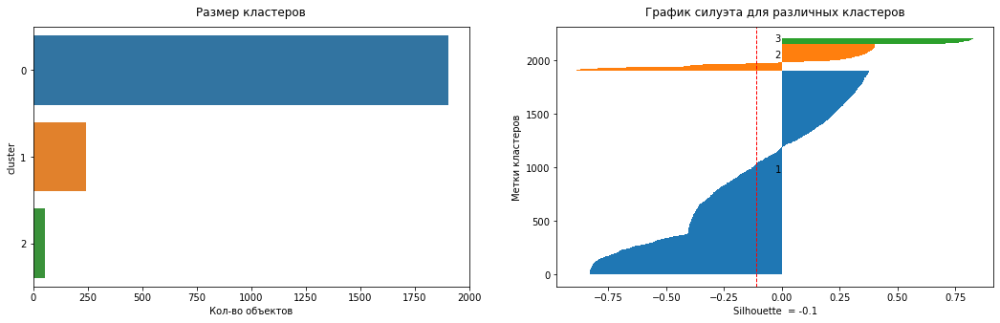

4 clusters
----------------------------------------------------------------------------------------------------


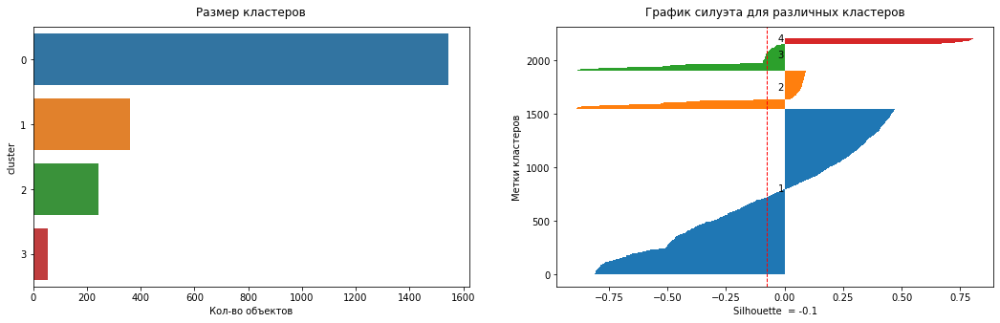

5 clusters
----------------------------------------------------------------------------------------------------


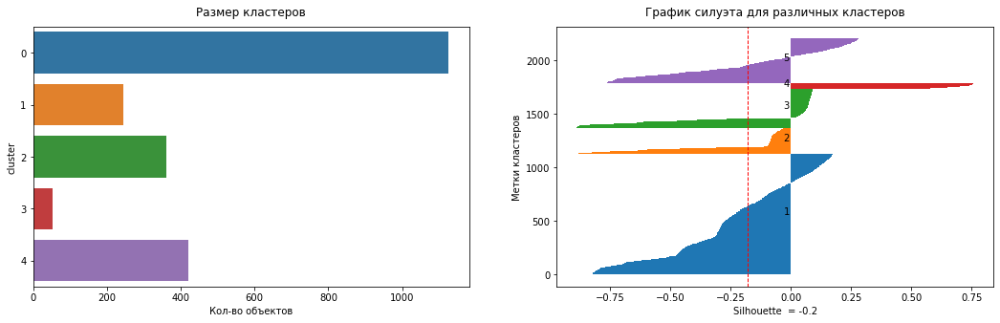

6 clusters
----------------------------------------------------------------------------------------------------


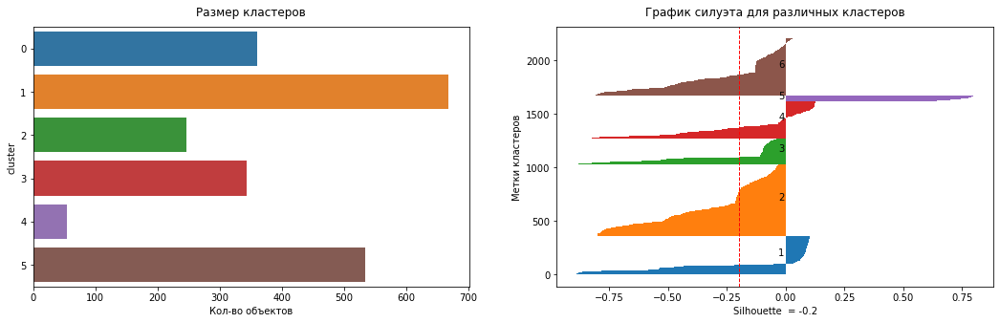

7 clusters
----------------------------------------------------------------------------------------------------


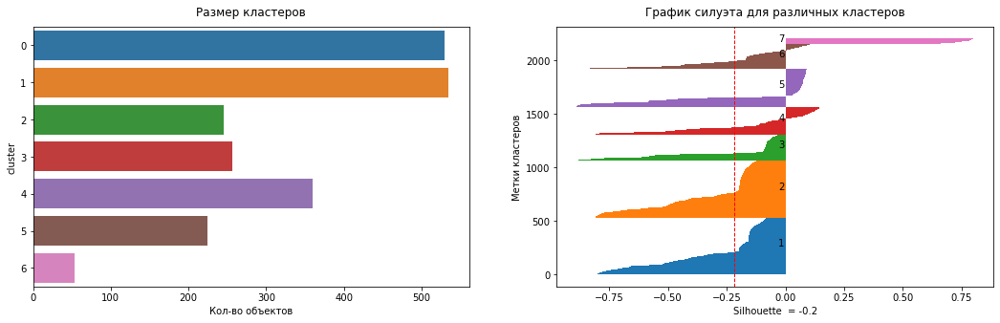

8 clusters
----------------------------------------------------------------------------------------------------


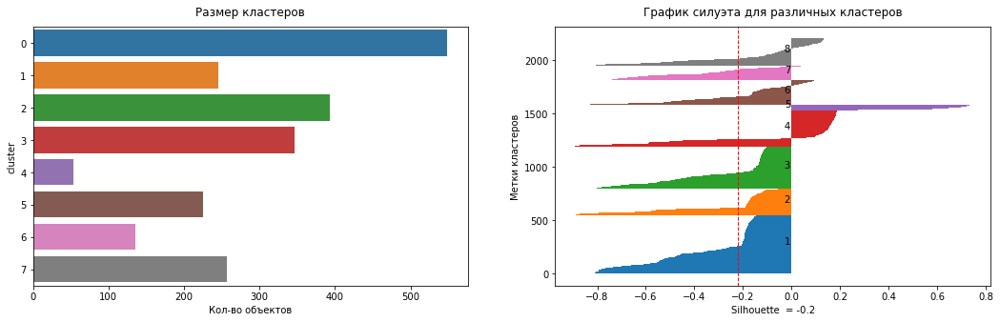

9 clusters
----------------------------------------------------------------------------------------------------


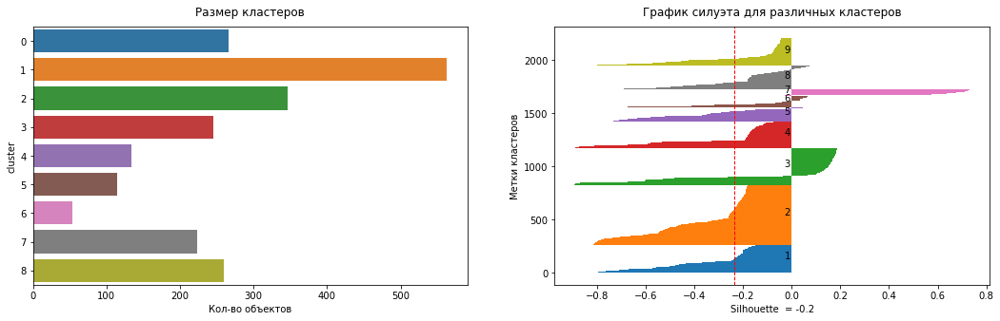

10 clusters
----------------------------------------------------------------------------------------------------


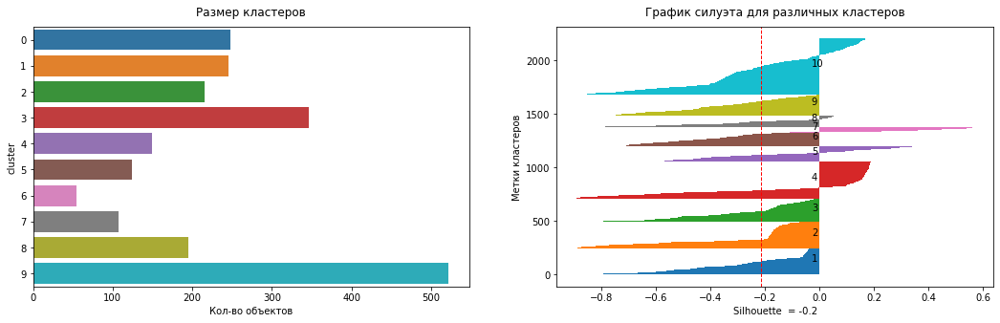

11 clusters
----------------------------------------------------------------------------------------------------


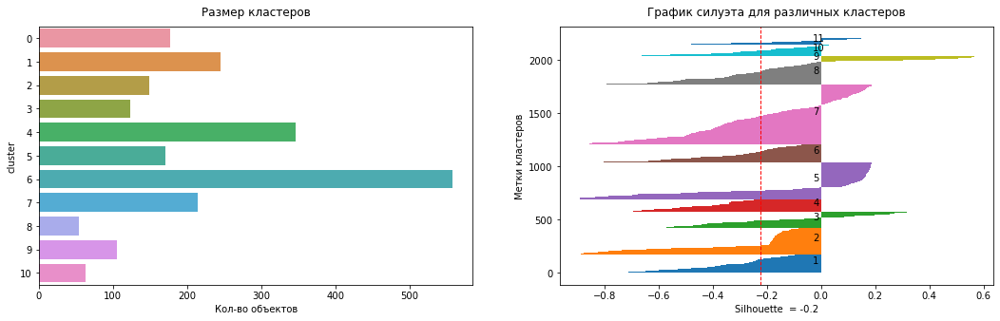

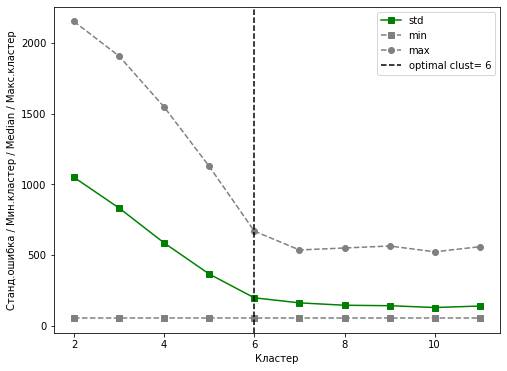

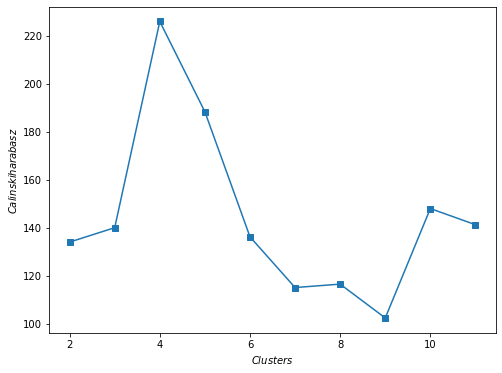

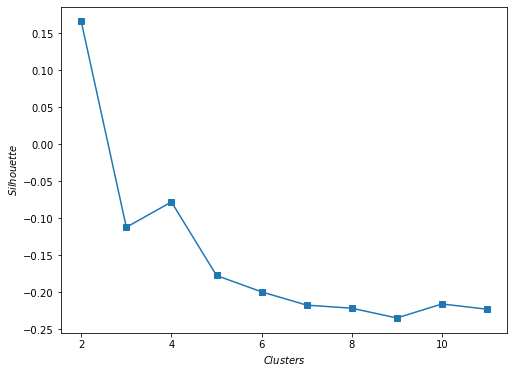

In [53]:
dict_clusters_spec = plot_clustering(
    data=df_labels,
    data_scale=None,
    embedding=X_embedding_pca,
    kwargs=params_cluster['SpectralClustering'],
    model=SpectralClustering,
    type_train='embedding')

Не рассматриваем в дальнейшем результаты SpectralClustering, так как получили низкие метрики. При обучении на скалированных данных (используем граф ближ соседей) получаем похожую картину, а также большой разброс в размерах кластеров

#### 3 clusters

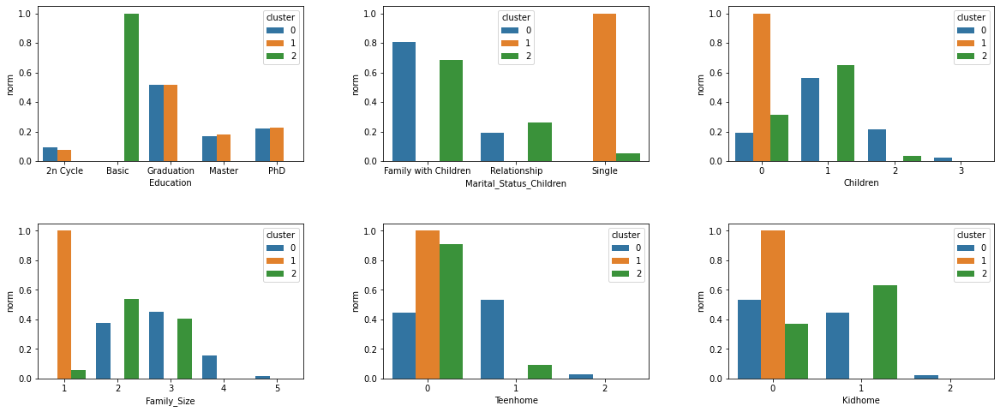

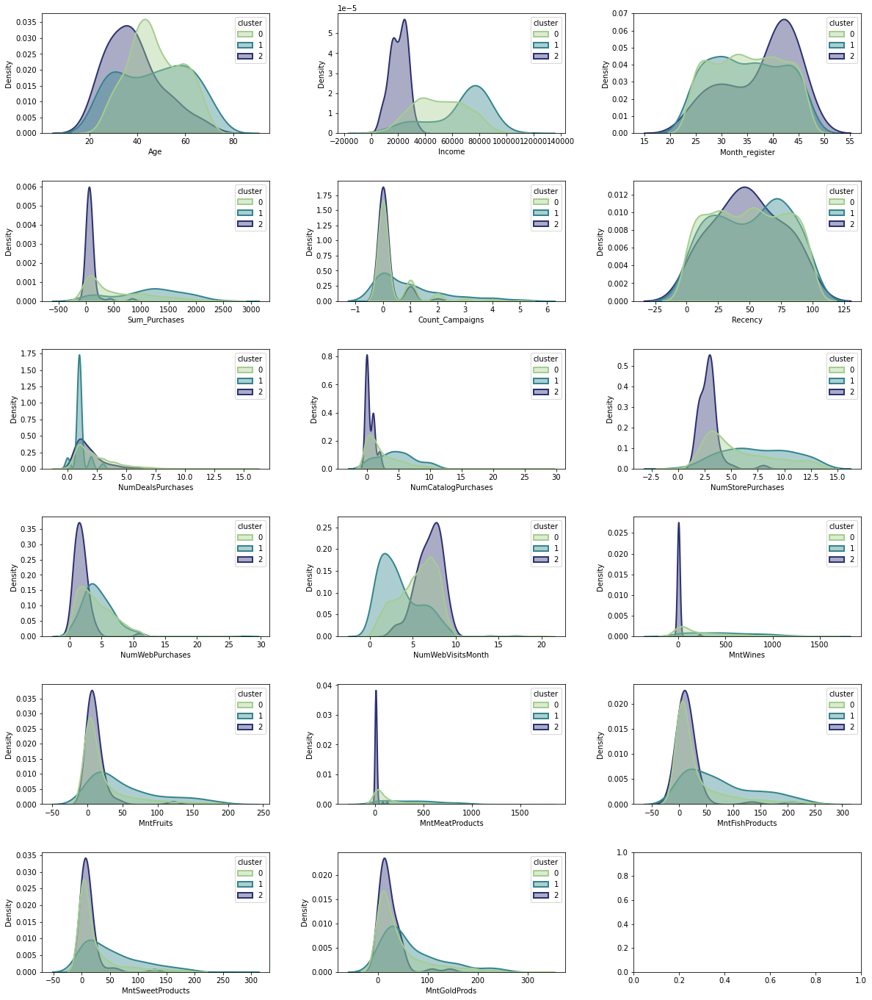

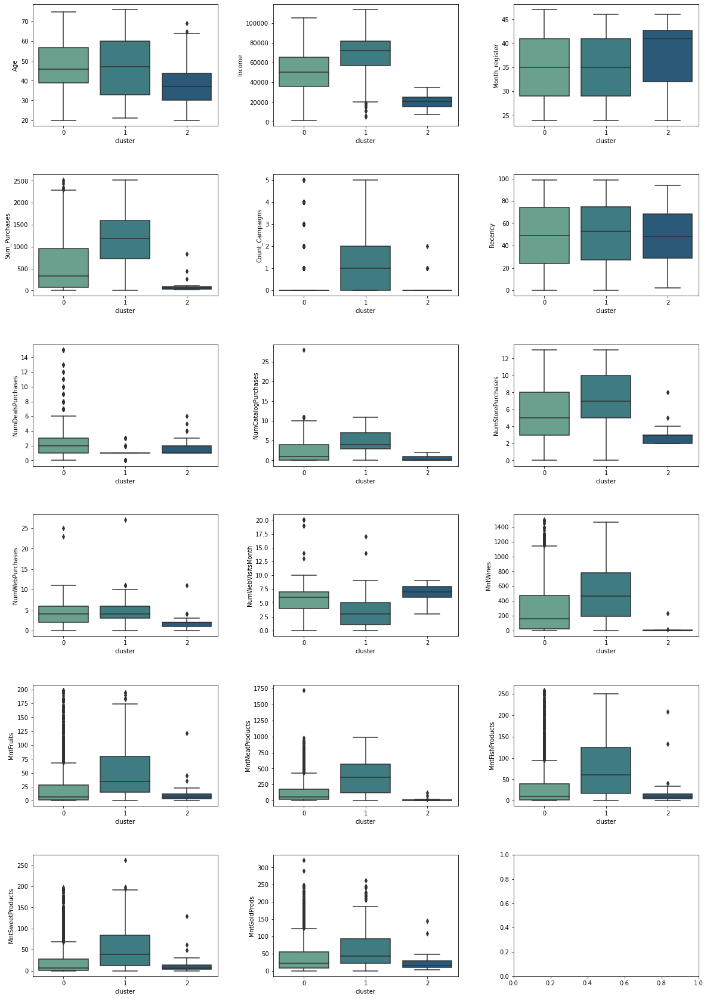

In [54]:
plotting_object(df, dict_clusters_spec[3], object_cols)
plotting_kde_num(df, dict_clusters_spec[3], num_cols)
plotting_num(df, dict_clusters_spec[3], num_cols)

**Описание**

- **0 кластер** - семьи с детьми, высшее образование (магистр, PhD, высшее, неоконченное), 0-3 ребенка в семье (подростки и маленькие дети), средний доход 47000, средний возраст 45 лет, низкое кол-во покупок 300, зарегестрированы ~ 35 мес, больше покупок по скидке, среднее кол-во покупок в магазине, веб, по каталогу, умеренно всего заходят на сайт, среднее кол-во покупок по разным типам продуктов

- **1 кластер** - люди без пары и без детей, высшее образование (магистр, PhD, высшее, неоконченное), средний доход 70000, средний возраст 49 лет, высокое кол-во покупок 1200, зарегестрированы ~ 35 мес, меньше всего покупок по скидке, больше в магазине, веб, по каталогу, меньше всего заходят на сайт, большое кол-во покупок по разным типам продуктов + больше покупок золота

- **2 кластер** - в основном семьи с детьми (в основном доподросткового возраста), есть люди в паре без детей, нет высшего образования, средний доход 20000, средний возраст 37 лет, низкое кол-во покупок 100, зарегестрированы ~42 мес, среднее кол-во покупок по скидке, мало по веб, каталогу, в магазине, чаще всего заходят на сайт, меньше всего покупок вина, фруктов, мяса, рыбы, сладкого, золота

In [55]:
fig = px.scatter_3d(
    X_embedding_pca, x=0, y=1, z=2,
    labels={'color': 'species'},
    color=dict_clusters_spec[3]
)
fig.update_traces(marker_size=2)
fig.show()

<AxesSubplot:xlabel='Income', ylabel='Sum_Purchases'>

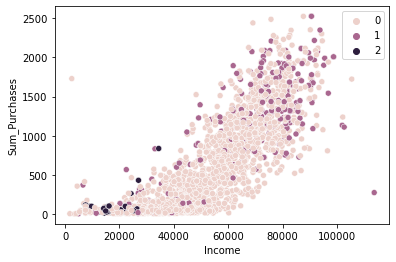

In [56]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=dict_clusters_spec[3])

#### 4 clusters

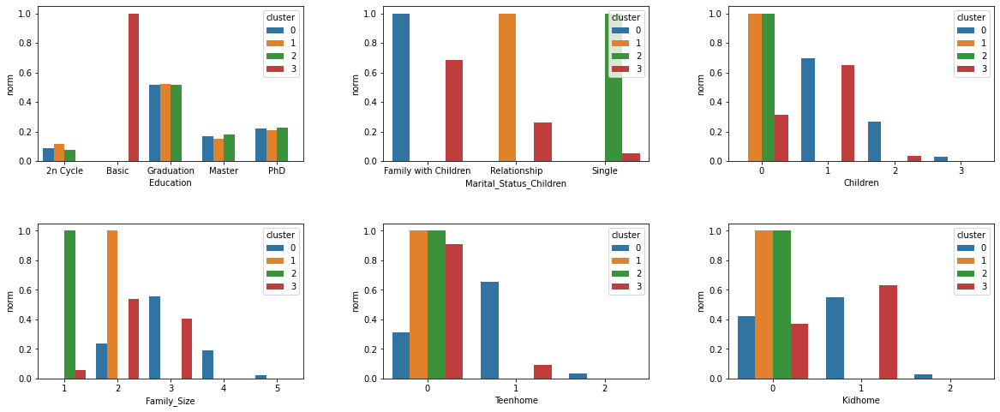

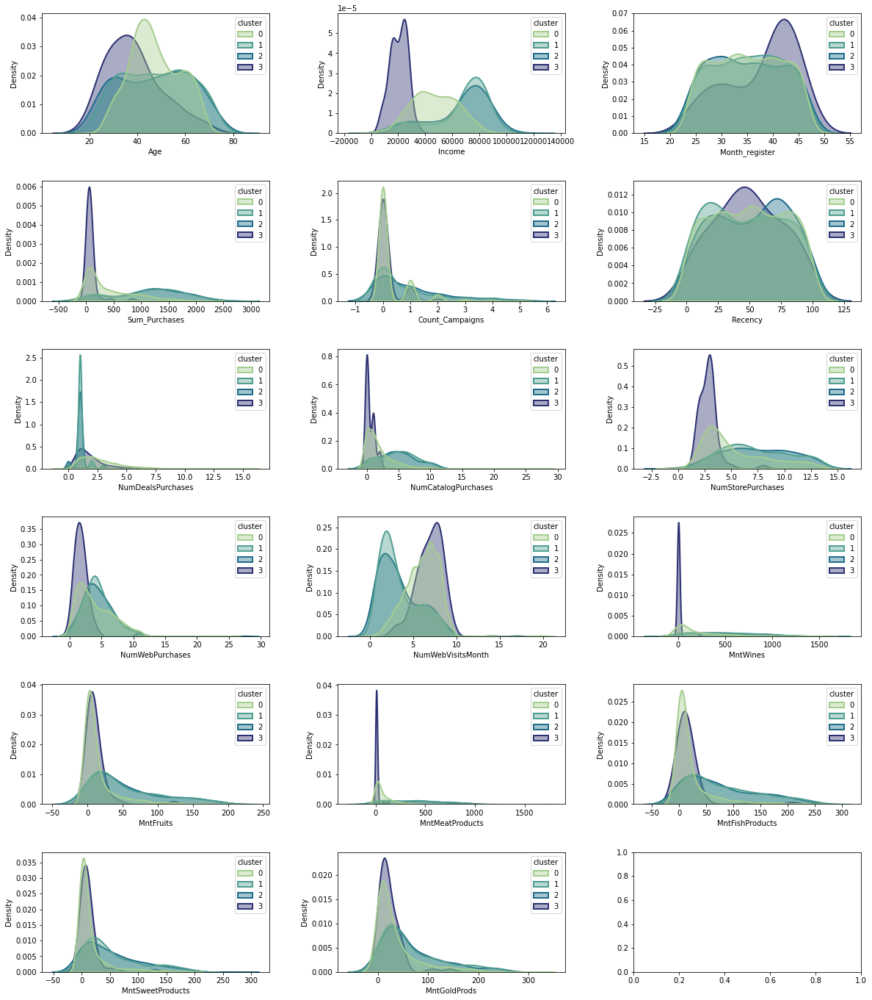

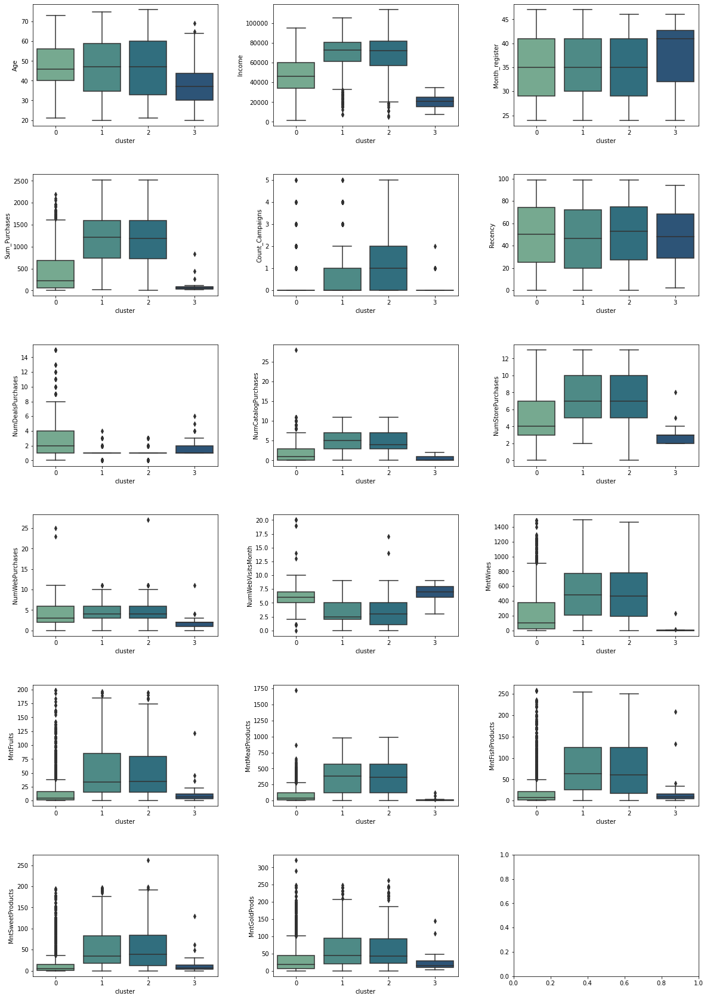

In [57]:
plotting_object(df, dict_clusters_spec[4], object_cols)
plotting_kde_num(df, dict_clusters_spec[4], num_cols)
plotting_num(df, dict_clusters_spec[4], num_cols)

In [58]:
fig = px.scatter_3d(
    X_embedding_pca, x=0, y=1, z=2,
    labels={'color': 'species'},
    color=dict_clusters_spec[4]
)
fig.update_traces(marker_size=2)
fig.show()

<AxesSubplot:xlabel='Income', ylabel='Sum_Purchases'>

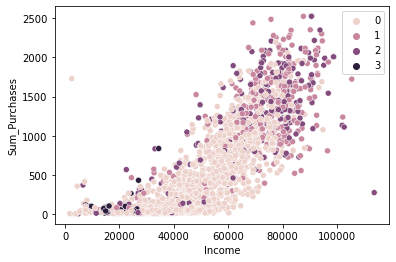

In [59]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=dict_clusters_spec[4])

#### Пример с разделенными кластерами на PCA

In [60]:
spec_pca = SpectralClustering(affinity='nearest_neighbors',
                              n_neighbors=35,
                              random_state=RAND,
                              n_jobs=-1,
                              n_clusters=4)
spec_pca.fit(X_embedding_pca_3)

SpectralClustering(affinity='nearest_neighbors', n_clusters=4, n_jobs=-1,
                   n_neighbors=35, random_state=10)

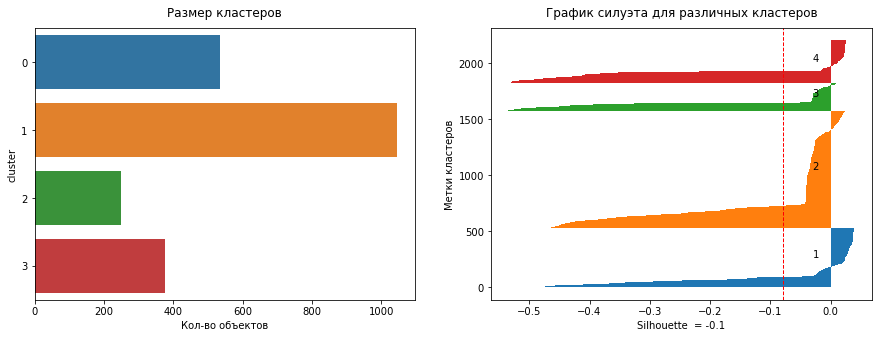

In [61]:
fig, axes = plt.subplots(ncols=2, figsize=(15,5))

plot_size(df_labels, spec_pca.labels_, ax=axes[0])
silhouette_plot(df_labels, spec_pca.labels_, ax=axes[1])

In [62]:
fig = px.scatter_3d(
    X_embedding_pca_3, x=0, y=1, z=2,
    labels={'color': 'species'},
    color=spec_pca.labels_
)
fig.update_traces(marker_size=2)
fig.show()

<AxesSubplot:xlabel='Income', ylabel='Sum_Purchases'>

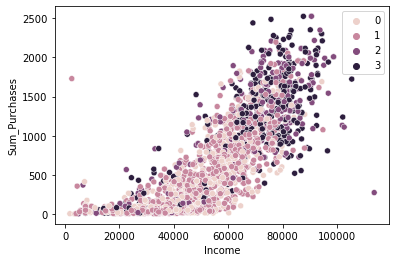

In [63]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=spec_pca.labels_)

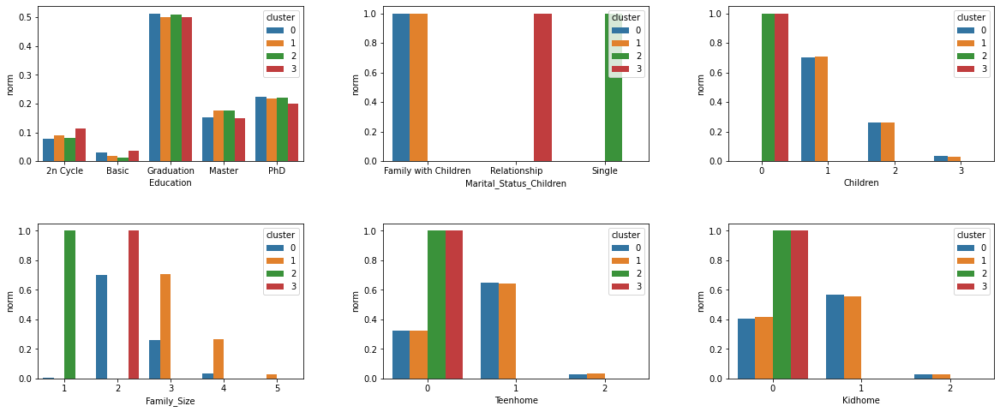

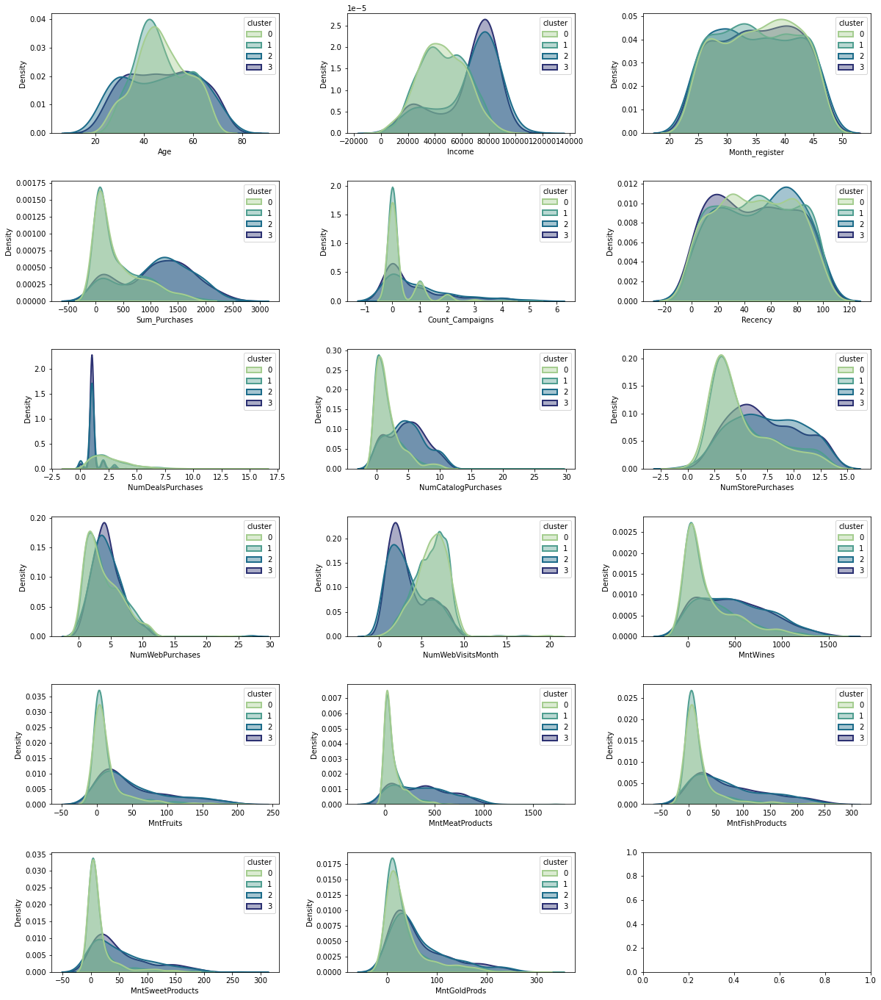

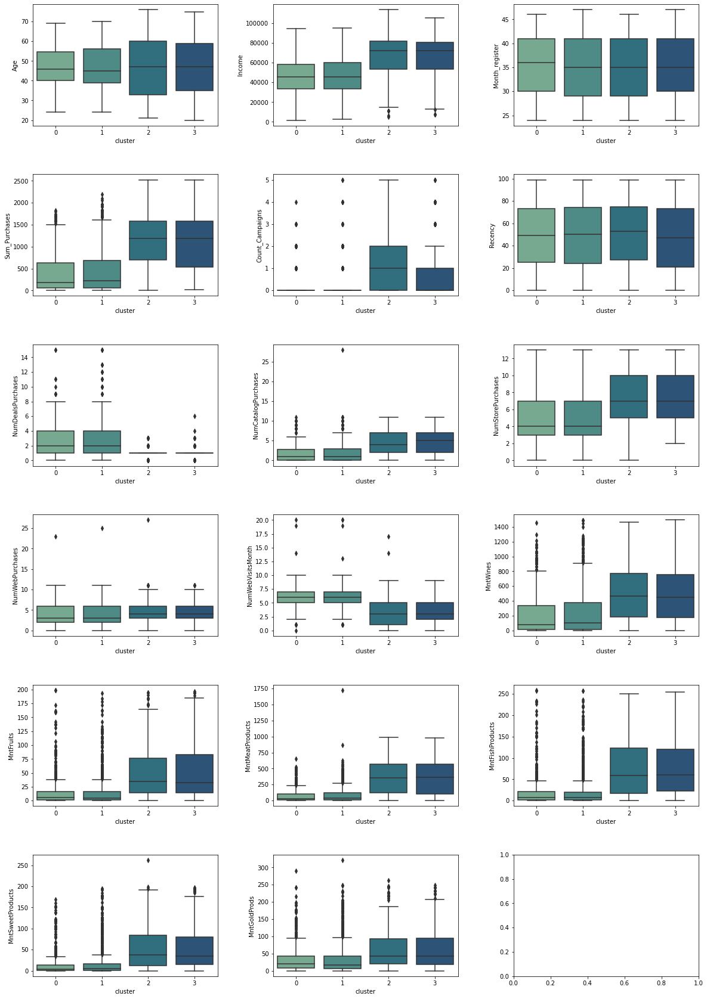

In [64]:
plotting_object(df, spec_pca.labels_, object_cols)
plotting_kde_num(df, spec_pca.labels_, num_cols)
plotting_num(df, spec_pca.labels_, num_cols)

### AgglomerativeClustering

Входит в семейство иеархических методов кластеризации. В самом начале каждый объект - это по сути кластер, далее происходит последовательное "слияние" кластеров и объединение их в группу (похоже в итоге на древовидную структуру). Кол-во кластеров получается путем отсечения дерева по заданному расстоянию. По умолчанию сводит к минимуму дисперсию объединяемых кластеров (linkage).

  0%|          | 0/10 [00:00<?, ?it/s]

2 clusters
----------------------------------------------------------------------------------------------------


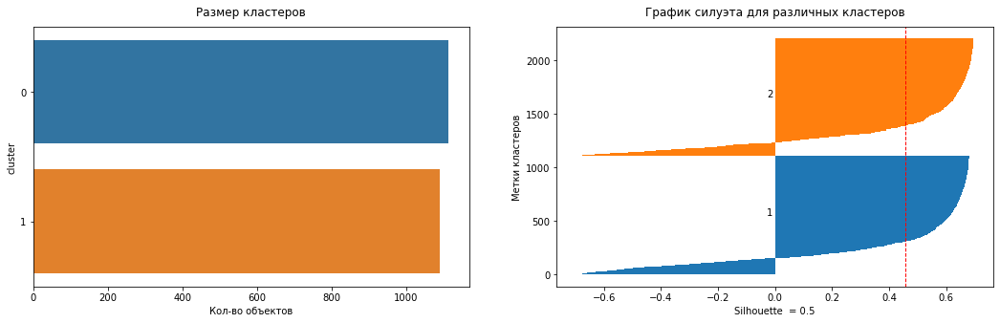

3 clusters
----------------------------------------------------------------------------------------------------


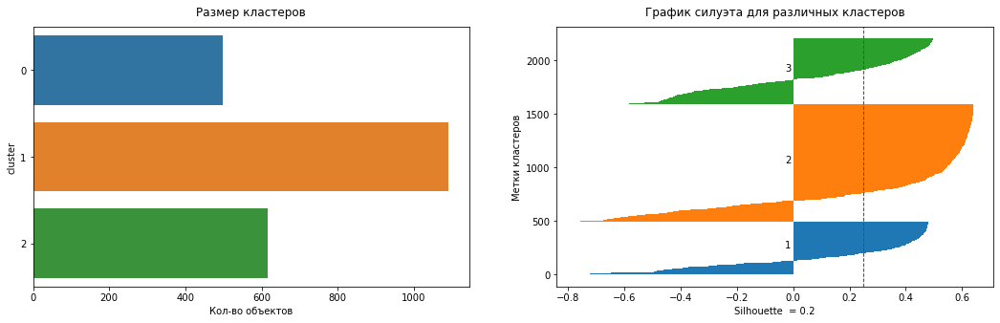

4 clusters
----------------------------------------------------------------------------------------------------


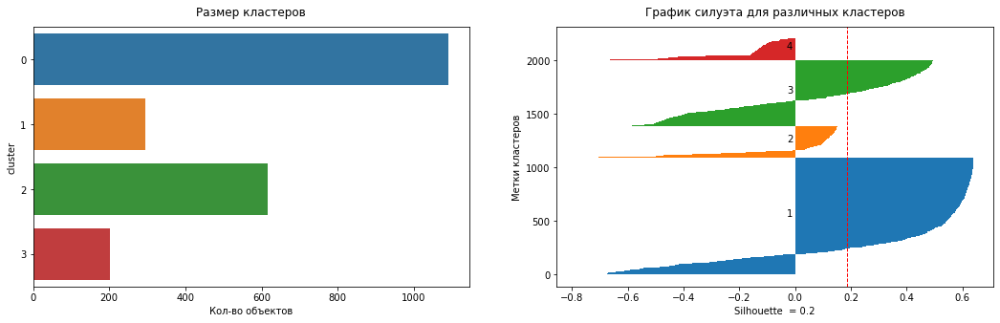

5 clusters
----------------------------------------------------------------------------------------------------


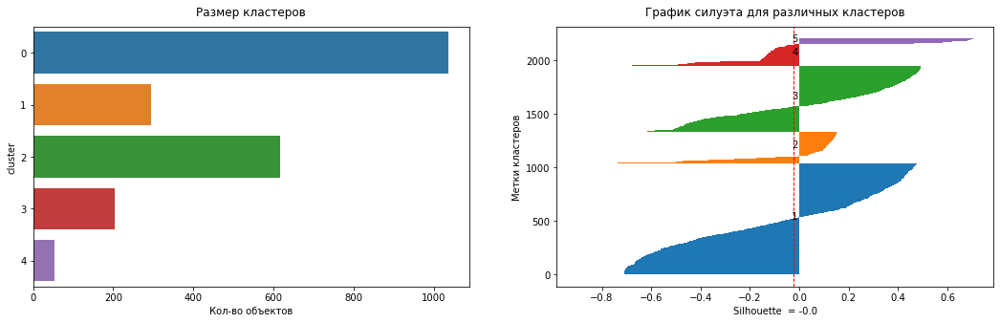

6 clusters
----------------------------------------------------------------------------------------------------


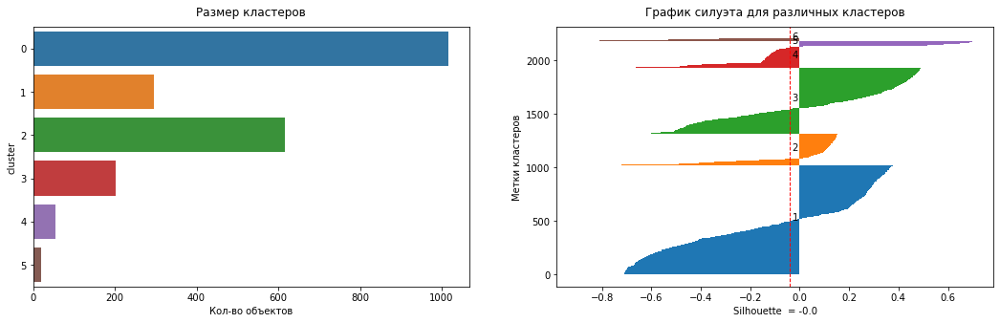

7 clusters
----------------------------------------------------------------------------------------------------


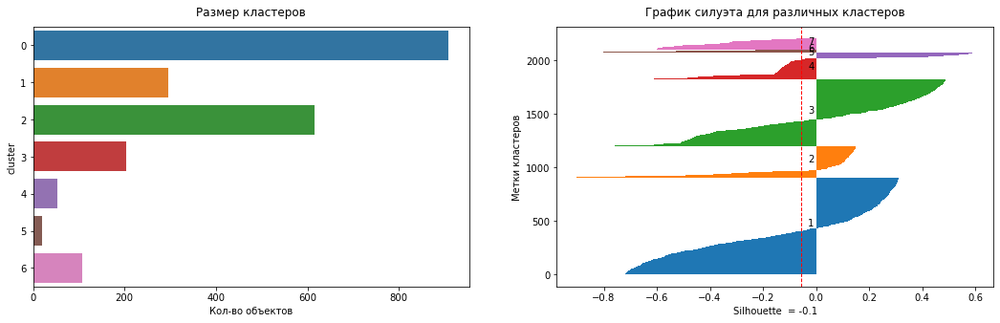

8 clusters
----------------------------------------------------------------------------------------------------


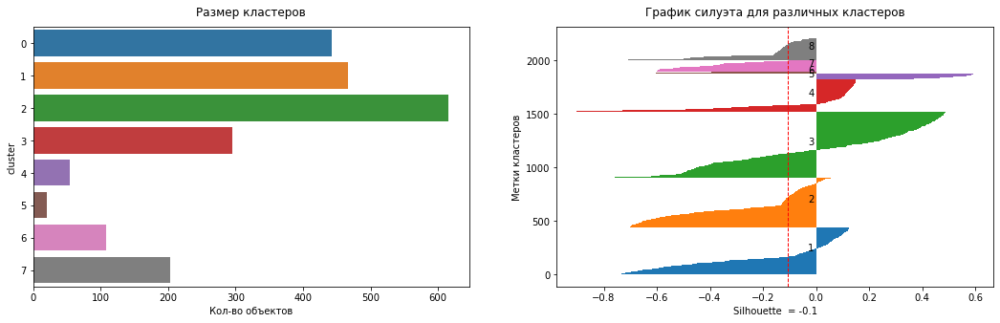

9 clusters
----------------------------------------------------------------------------------------------------


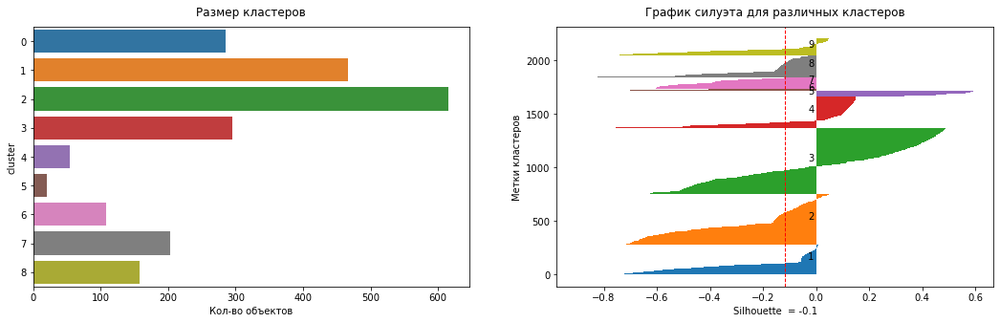

10 clusters
----------------------------------------------------------------------------------------------------


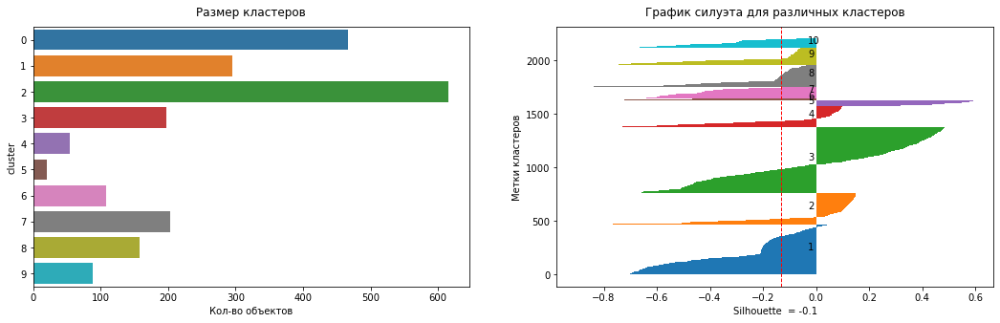

11 clusters
----------------------------------------------------------------------------------------------------


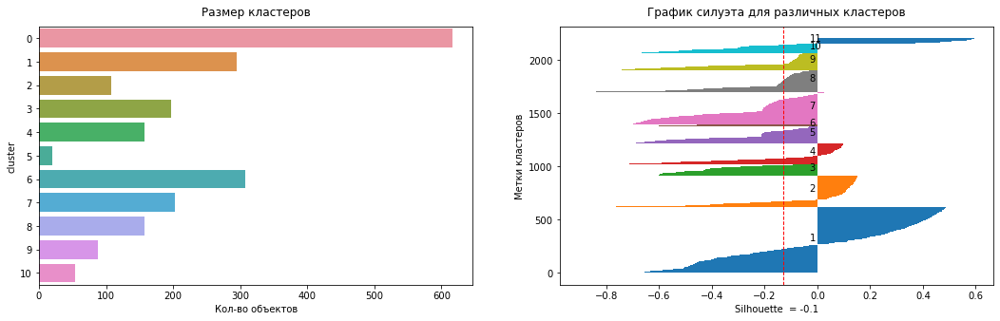

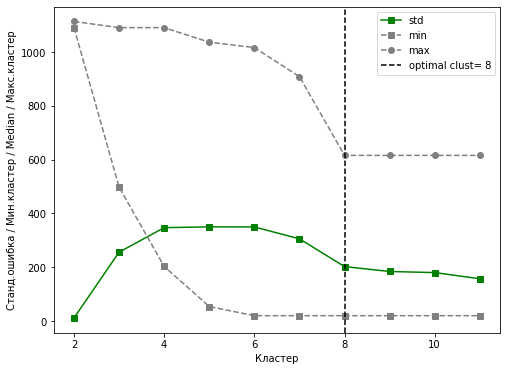

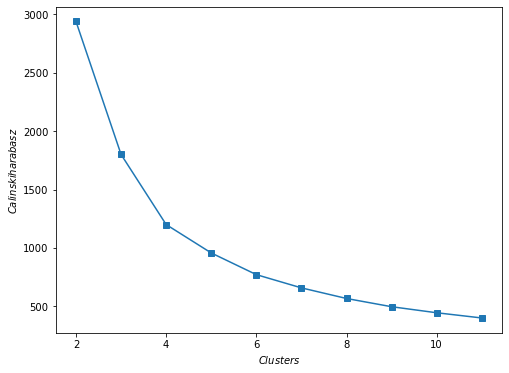

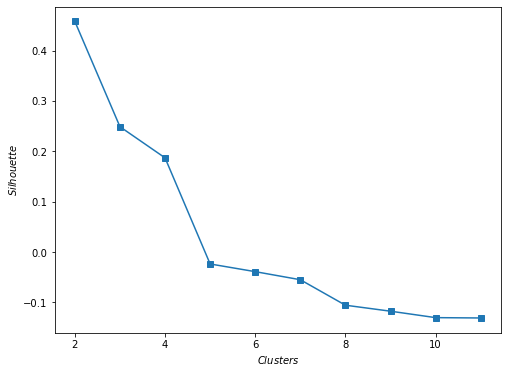

In [65]:
dict_clusters_ag = plot_clustering(
    data=df_labels,
    data_scale=None,
    embedding=X_embedding_pca,
    kwargs=params_cluster['AgglomerativeClustering'],
    model=AgglomerativeClustering,
    type_train='embedding')

#### 3 clusters

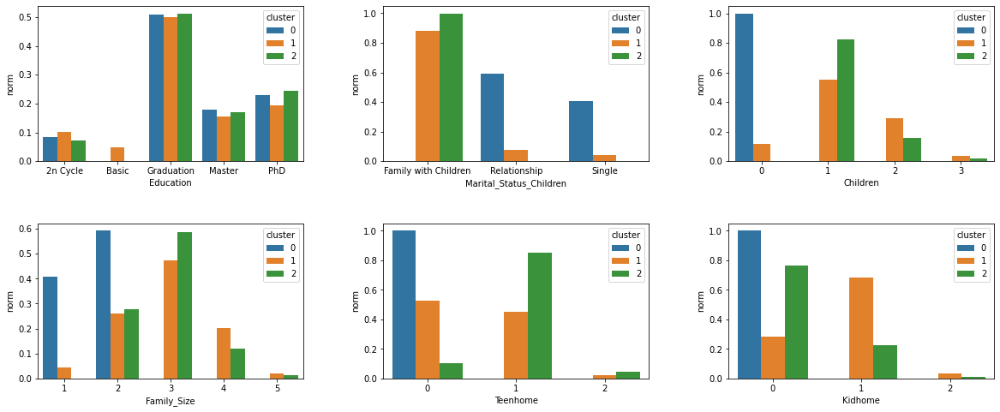

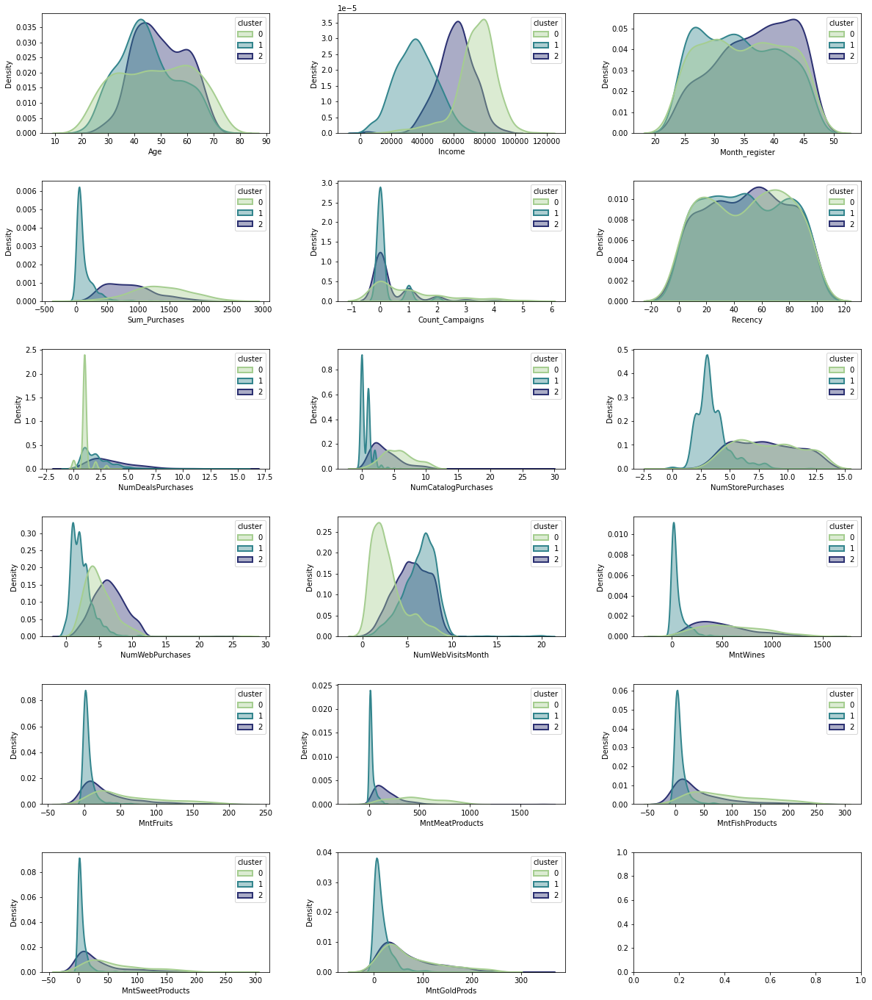

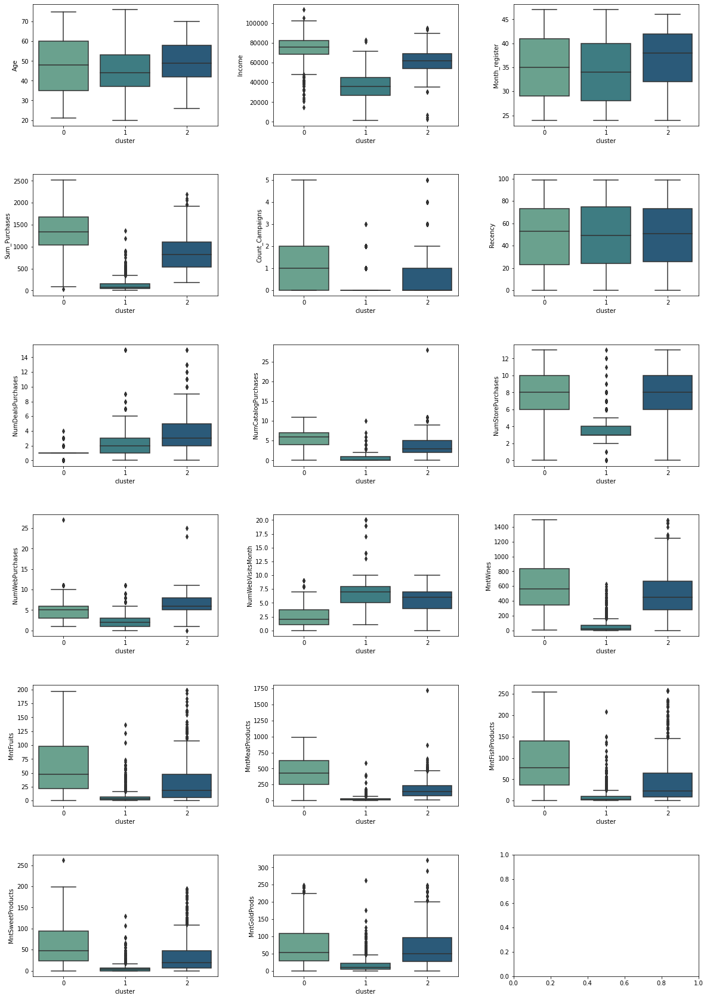

In [66]:
plotting_object(df, dict_clusters_ag[3], object_cols)
plotting_kde_num(df, dict_clusters_ag[3], num_cols)
plotting_num(df, dict_clusters_ag[3], num_cols)

**Описание**


- **0 кластер** - люди без пары, либо в паре без детей, высшее образование (магистр, PhD) + неоконченное высшее, средний доход 78000, средний возраст 49 лет, ср кол-во покупок 1300 (высоко), зарегестрированы ~ 35 мес, мало покупок по скидке, среднее по веб, больше покупок с использованием каталога, в магазине, больше покупок вина, фруктов, мяса, рыбы, сладкого и чуть больше остальных золота

- **1 кластер** - семьи с детьми (немного тех, кто без детей), высшее образование (магистр, PhD) + неоконченное высшее, 0-3 ребенка в семье (преимущественно доподросткового возраста), средний доход 37000, средний возраст 45 лет, ср кол-во покупок 150 (мало), зарегестрированы ~ 34 мес, среднее кол-во покупок по скидке, мало покупок по веб/каталогу/в магазине, зато чаще остальных заходили на сайт, мало покупок по разным типам продуктов

- **2 кластер** - семьи с детьми, высшее образование (магистр, PhD), 1-3 ребенка в семье (преимущественно подростки), средний доход 60000, средний возраст 50 лет, ср кол-во покупок 750 (средне), зарегестрированы ~ 37 мес, больше всего покупок по скидке, в магазине, веб, среднее по каталогу, среднее кол-во покупок по разным типам продуктов

In [67]:
fig = px.scatter_3d(
    X_embedding_pca, x=0, y=1, z=2,
    labels={'color': 'species'},
    color=dict_clusters_ag[3]
)
fig.update_traces(marker_size=2)
fig.show()

<AxesSubplot:xlabel='Income', ylabel='Sum_Purchases'>

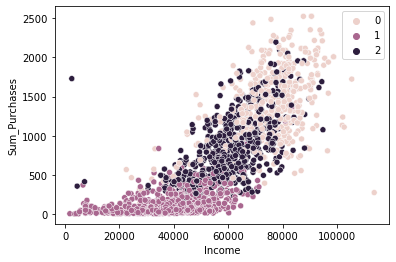

In [68]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=dict_clusters_ag[3])

#### 4 clusters

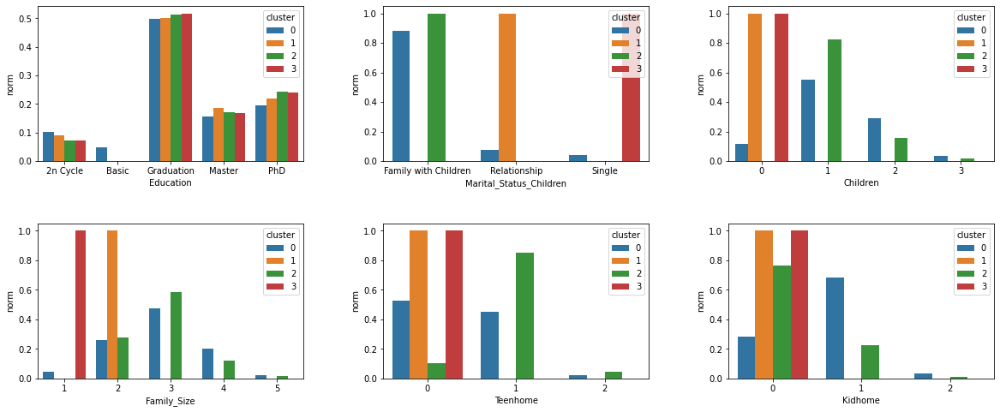

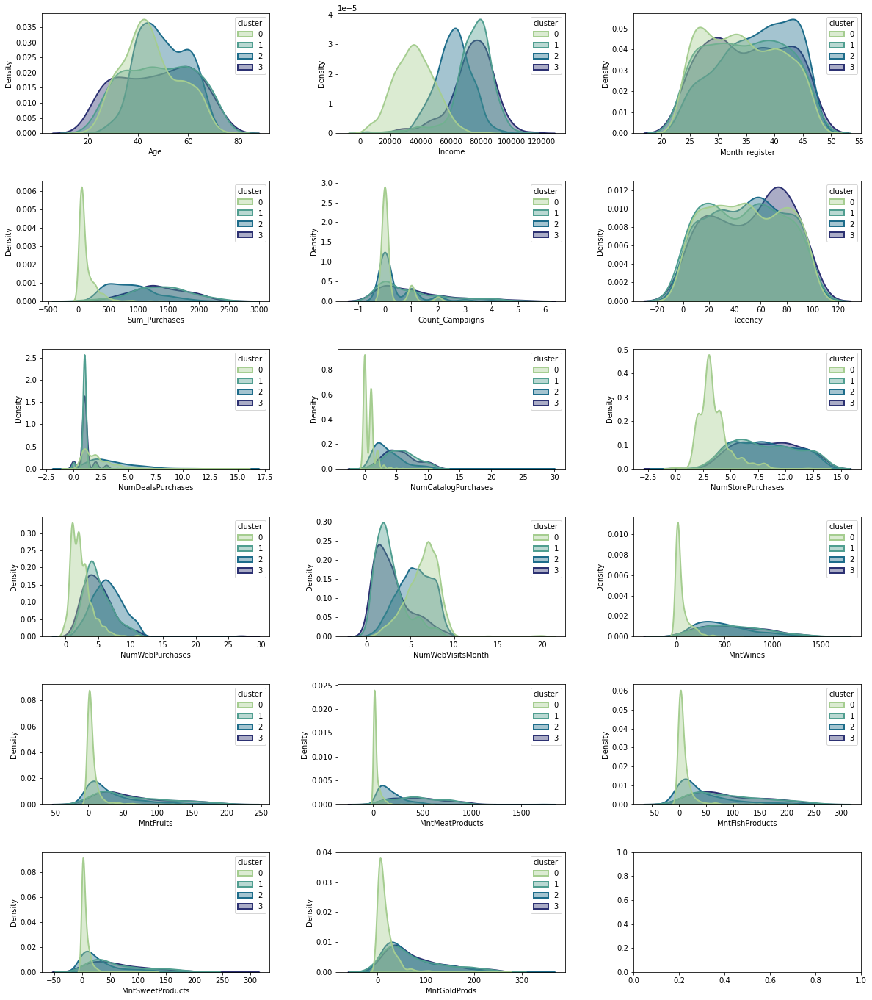

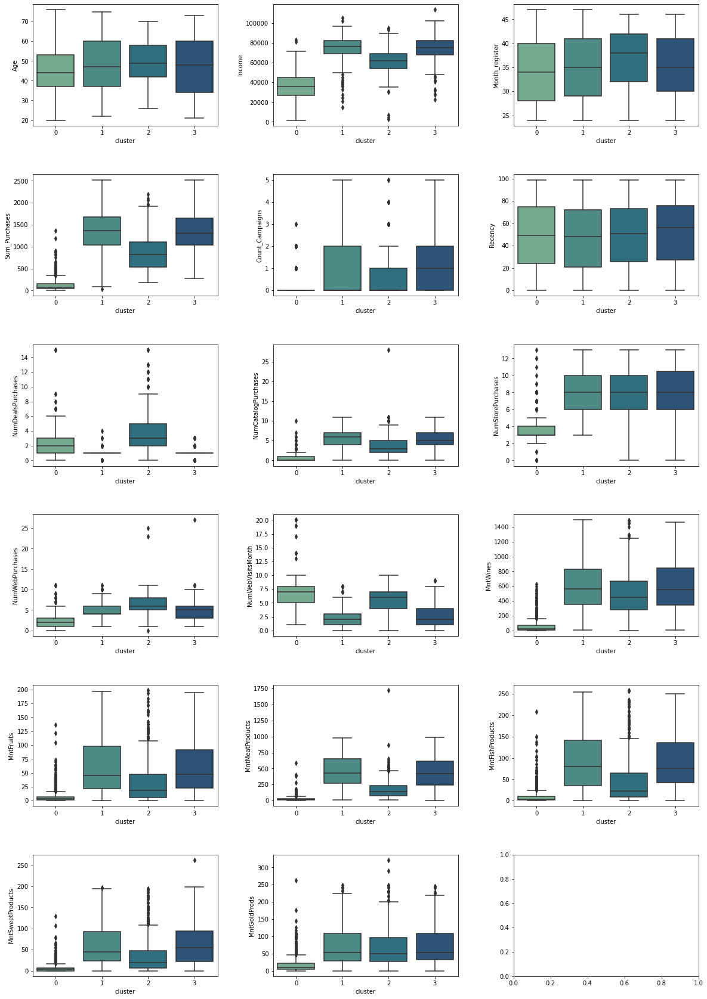

In [69]:
plotting_object(df, dict_clusters_ag[4], object_cols)
plotting_kde_num(df, dict_clusters_ag[4], num_cols)
plotting_num(df, dict_clusters_ag[4], num_cols)

In [70]:
fig = px.scatter_3d(
    X_embedding_pca, x=0, y=1, z=2,
    labels={'color': 'species'},
    color=dict_clusters_ag[4]
)
fig.update_traces(marker_size=2)
fig.show()

<AxesSubplot:xlabel='Income', ylabel='Sum_Purchases'>

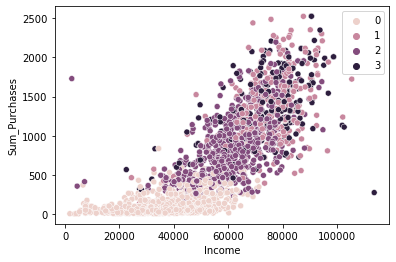

In [71]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=dict_clusters_ag[4])

# Выводы

In [72]:
df_save_label = pd.get_dummies(df_save)

df_done = df_save_label[num_cols + cols_acc]
df_done = df_done.assign(cluster_km = dict_clusters_km[3])
df_done = df_done.assign(cluster_ag = dict_clusters_ag[3])

df_done[:3]

,Age,Income,Month_register,Sum_Purchases,Count_Campaigns,Recency,NumDealsPurchases,NumCatalogPurchases,NumStorePurchases,NumWebPurchases,...,MntSweetProducts,MntGoldProds,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,cluster_km,cluster_ag
0,59,58138.0,45,1617,1,58,3,10,4,8,...,88,88,0,0,0,0,0,1,1,0
1,62,46344.0,27,27,0,38,2,1,2,1,...,1,6,0,0,0,0,0,0,0,1
2,51,71613.0,34,776,0,26,1,2,10,8,...,21,42,0,0,0,0,0,0,1,0


In [73]:
print(
    f'silhouette KMeans: {round(silhouette_score(df_done, df_done.cluster_km), 2)}'
)
print(
    f'silhouette Agl: {round(silhouette_score(df_done, df_done.cluster_ag), 2)}'
)

silhouette KMeans: 0.28
silhouette Agl: 0.25


In [74]:
from itertools import *


def calculate_diff(data: pd.DataFrame):
    diff = []
    mean_val = (data.sum(axis=1) / 3).tolist()
    comb = list(combinations(data.columns, 2))

    for i in comb:
        diff.append(abs(data[i[0]].sub(data[i[1]], axis=0)))
    diff = np.mean(diff, axis=0) / mean_val
    return diff

In [75]:
df_diff = pd.DataFrame()
df_diff['km_diff'] = calculate_diff(
    df_done.groupby('cluster_km')[num_cols].median().T)
df_diff['ag_diff'] = calculate_diff(
    df_done.groupby('cluster_ag')[num_cols].median().T)
df_diff.index = num_cols

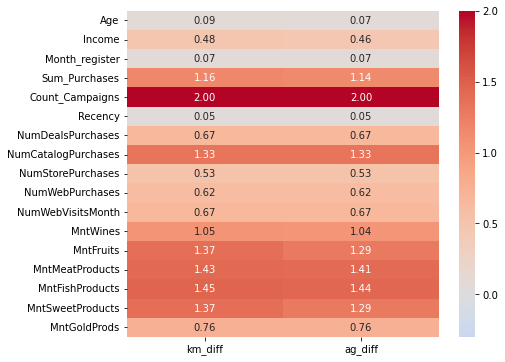

In [76]:
plt.figure(figsize=(7, 6))

sns.heatmap(df_diff,
            annot=True,
            fmt='.2f',
            vmin=-0.3,
            center=0,
            cmap='coolwarm');

Для AgglomerativeClustering и KMeans получились похожие результаты, чуть лучше отработал KMeans, поэтому возьмем 3 кластера с описанной ранее интерпретацией. 

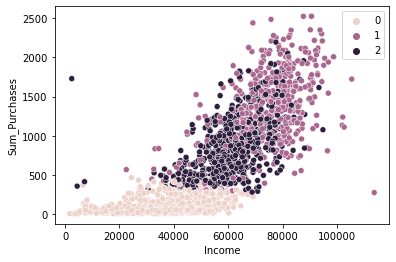

In [77]:
sns.scatterplot(df.Income, df.Sum_Purchases, hue=dict_clusters_km[3]);

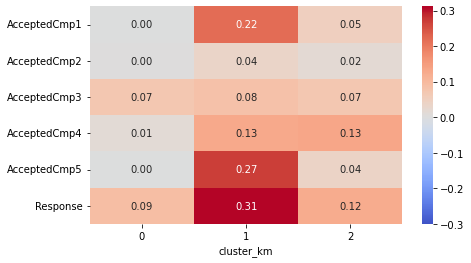

In [78]:
size_cluster = df_done.drop('cluster_ag',
                            axis=1).groupby('cluster_km').count().iloc[:, 0]

norm_acc = df_done.drop('cluster_ag',
             axis=1).groupby('cluster_km')[sorted(cols_acc)].sum().T / size_cluster

plt.figure(figsize=(7, 4))
sns.heatmap(norm_acc,
            annot=True,
            fmt='.2f',
            vmin=-0.3,
            center=0,
            cmap='coolwarm');

**Описание**

- **0 кластер** - семьи с детьми (немного тех, кто без детей), высшее образование (магистр, PhD) + неоконченное высшее, 0-3 ребенка в семье (преимущественно доподросткового возраста), средний доход 37000, средний возраст 45 лет, небольшое кол-во покупок 150, относительно недавно зарегестрированы ~ 34 мес, среднее кол-во покупок по скидке, мало покупок по веб/каталогу/в магазине, зато чаще остальных заходили на сайт, мало покупок по разным типам продуктов. **Возможно просто заходят на сайт магазина ради интереса, не являются потенциальными покупателями**

- **1 кластер** - люди без пары, либо в паре без детей, высшее образование (магистр, PhD) + неоконченное высшее, средний доход 79000, средний возраст 47 лет, больше кол-во покупок 1250, дальше зарегестрированы ~36 мес, мало покупок по скидке, среднее по веб, больше покупок с использованием каталога, в магазине, больше покупок вина, фруктов, мяса, рыбы, сладкого и чуть больше остальных золота. **Потенциальные покупатели с высоким доходом и большим кол-вом покупок**

- **2 кластер** - семьи с детьми, высшее образование (магистр, PhD), 1-2 ребенка в семье (преимущественно подростки), средний доход 60000, средний возраст 50 лет, ср кол-во покупок 750, зарегестрированы ~ 38 мес, больше всего покупок по скидке, в магазине, веб, среднее по каталогу, среднее кол-во покупок по разным типам продуктов. **Потенциальные покупатели со средним доходом и средним кол-вом покупок, возможно для них больший интерес будут представлять товары для детей**